<a href="https://colab.research.google.com/github/Payal2000/Data-Science-Assignments-INFO6105/blob/main/Assignment_3_Model_Interpretibility.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Model_Interpretibility**

## Abstract

This dataset is used to predict if the person is suffering from Breast Cancer based on several medical parameters as mentioned below.


# **What is our ultimate aim with this notebook?**

### Our ultimate aim is to intrepret the results of
- Linear Model
- Tree Based Model
- Best Model of AutoML H20
- Run SHAP analysis on all the above interpret the SHAP values and compare them with the other model interpretability methods.

### Different Model Interpretibility Methods.
- SHAP analysis using different plots
- LIME analysis
- Partial Dependence Plot Analysis

## **Column Description for our Dataset**

**Kaggle Dataset Link:** https://www.kaggle.com/datasets/yasserh/breast-cancer-dataset

## **Target Variable/Dependent Variable**

All variables except for the diagnosis are predictor variables.

## **Column Description for Breast Cancer Detection Dataset:**

- **id:** Unique identifier for each patient or observation.
- **diagnosis:** The diagnosis of breast tissues. M: Malignant - Indicates cancerous tumors. B: Benign - Indicates non-cancerous tumors.
- **radius_mean:** Mean of distances from the center to points on the perimeter of the tumor.
- **texture_mean:** Standard deviation of gray-scale values, which can give an indication of the texture or smoothness of the tumor.
- **perimeter_mean:** Mean size of the core tumor.
- **area_mean:** Mean area covered by the tumor.
- **smoothness_mean:** Mean of the local variation in radius lengths.
- **compactness_mean:** Mean of the perimeter^2 / area - 1.0.
- **concavity_mean:** Mean of the severity of concave portions of the contour of the tumor.
- **concave points_mean:** Mean number of concave portions of the contour.
- symmetry_mean: Mean symmetry of the tumor.
- **fractal_dimension_mean:** It gives an indication of how the shape of the tumor deviates from a simple shape.

The columns with the worst suffix (like radius_worst, texture_worst, etc.) provide the worst or largest mean value for each feature, derived from an average of three largest values.

In [1]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install -U scikit-learn
!pip install matplotlib-venn
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o


import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
#import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns


plt.rcParams["figure.figsize"] = (32, 24)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=18c10eddf9e58bc0efc1720d3e1425e97a47a741d6988b5fa63bcf7640ade50c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 47.8 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.3/265.3 MB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.2-py2.py3-none-any.whl size=265363806 sha256=c0daf7048a4b2f6f8ad5b1713b4a3de73a6b53596aefa

In [2]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [3]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

6


In [4]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:7759..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp7dddy90q
  JVM stdout: /tmp/tmp7dddy90q/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp7dddy90q/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:7759
Connecting to H2O server at http://127.0.0.1:7759 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.2
H2O_cluster_version_age:,25 days
H2O_cluster_name:,H2O_from_python_unknownUser_wtmqyg
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [5]:
# Reading CSV file into Pandas DataFrame
pandas_df = pd.read_csv("https://raw.githubusercontent.com/Payal2000/Data-Science-Assignments-INFO6105/main/new_model.csv")

In [6]:
# Training Feature
X = pandas_df.drop(["diagnosis"], axis=1)
# Target variable
Y = pandas_df["diagnosis"]

In [7]:
# Splitting Data into Training and Test with the ratio of 1:9
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

In [8]:
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

The code is taking a random sample of 100 data points from both the training and testing sets using the shap.utils.sample function. This is because SHAP analysis can be computationally expensive, especially for large datasets, and using a smaller sample of the data can speed up the process without sacrificing too much accuracy. These samples will be used for SHAP analysis later on.







## **Fitting a Linear Model**

In [10]:
from sklearn.preprocessing import LabelEncoder

# Assuming y_train contains target labels like 'M' and 'B'
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)  # Convert labels to integers

# Now fit the linear model
linear_model.fit(x_train, y_train_encoded)


LinearRegression()

In [11]:
# Dropping the target variable 'diagnosis'
df = pandas_df.drop("diagnosis", axis=1)

# Applying Min-Max scaling
# (value - min) / (max - min)
df_norm = (df - df.min()) / (df.max() - df.min())

# Concatenating the scaled features with the original 'diagnosis' column
df_norm = pd.concat([df_norm, pandas_df["diagnosis"]], axis=1)


- Dropping the Target Variable: df = pandas_df.drop("diagnosis", axis=1) removes the 'diagnosis' column from the dataset and stores the remaining features in df.

- Applying Min-Max Scaling: (df - df.min()) / (df.max() - df.min()) scales each feature to a range between 0 and 1. This is achieved by subtracting the minimum value of each column and then dividing by the range (max - min) of that column.

- Concatenating with the Target Variable: pd.concat([df_norm, pandas_df["diagnosis"]], axis=1) adds the 'diagnosis' column back to the normalized feature set.

In [12]:
import statsmodels.api as sm
import pandas as pd

# Convert 'diagnosis' to a numeric format: 'M' -> 1, 'B' -> 0
pandas_df['diagnosis'] = pandas_df['diagnosis'].map({'M': 1, 'B': 0})

# Selecting a subset of features for the model
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean',
            'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Add a constant to the model (intercept)
X = sm.add_constant(pandas_df[features])

# 'diagnosis' is the target variable
y = pandas_df['diagnosis']

# Fit the OLS model
model = sm.OLS(y, X).fit()

# Print out the statistics
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              diagnosis   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.677
Method:                 Least Squares   F-statistic:                     120.1
Date:                Mon, 04 Dec 2023   Prob (F-statistic):          4.40e-132
Time:                        00:14:29   Log-Likelihood:                -67.236
No. Observations:                 569   AIC:                             156.5
Df Residuals:                     558   BIC:                             204.3
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -2.0521      0.417     -4.925      0.000      -2.870      -1.234
radius_mean                0.4900      0.131      3.734      0.000       0.232       0.748
texture_mean               0.0220      0.003      7.518      0.000       0.016       0.028
perimeter_mean            -0.0550      0.021     -2.618      0.009      -0.096      -0.014
area_mean                 -0.0010      0.000     -3.881      0.000      -0.001      -0.000
smoothness_mean            1.9409      1.411      1.376      0.169      -0.830       4.712
compactness_mean           0.0973      1.039      0.094      0.925      -1.944       2.138
concavity_mean             0.8098      0.495      1.635      0.103      -0.163       1.783
concave points_mean        6.4310      1.386      4.641      0.000       3.709       9.153
symmetry_mean              1.0119      0.561      1.803      0.072      -0.091       2.114
fractal_dimension_mean    -0.1193      4.158     -0.029      0.977      -8.286       8.048
==============================================================================
Omnibus:                       13.881   Durbin-Watson:                   1.628
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               14.538
Skew:                           0.384   Prob(JB):                     0.000697
Kurtosis:                       2.843   Cond. No.                     2.75e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.75e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# **Interpreting Regression Co-efficients**

### **P-Values**

- **radius_mean**(coef: 0.4900, p: 0.000): Highly significant. Indicates a positive relationship with the diagnosis, suggesting that as the mean radius increases, the likelihood of a malignant diagnosis increases.
- **texture_mean** (coef: 0.0220, p: 0.000): Statistically significant with a positive coefficient, meaning a higher texture mean is associated with malignancy.
- **perimeter_mean** (coef: -0.0550, p: 0.009): Significant, but with a negative coefficient, indicating an inverse relationship with the diagnosis.
area_mean (coef: -0.0010, p: 0.000): Significant with a negative relationship, implying larger areas are inversely related to a malignant diagnosis.
- **smoothness_mean, compactness_mean, concavity_mean, symmetry_mean, fractal_dimension_mean:** Not statistically significant (p > 0.05), suggesting a weaker linear relationship with the diagnosis in this model.
- **concave points_mean** (coef: 6.4310, p: 0.000): Very significant and shows a strong positive relationship with a malignant diagnosis.

### **Skew and Kurtosis**

- **Skew (0.384):** Indicates a slight right-skew in the distribution of the model's residuals, but not severe.
- **Kurtosis (2.843):** Shows a distribution with slightly less peak and heavier tails compared to a normal distribution.

### **Durbin-Watson Test**

- With a value of 1.628, it hints at a mild positive autocorrelation in the residuals. However, this value is relatively close to 2, which is ideal, indicating that autocorrelation might not be a significant issue in this model.

### **Jarque-Bera Test**

- The JB test value (14.538) with a low p-value (0.000697) indicates that the residuals of the model do not follow a normal distribution. This could impact the reliability of some of the regression assumptions.

# **Fit Tree Based Model**

In [14]:
from sklearn.ensemble import RandomForestClassifier

# No need to encode y_train if it's categorical ('M', 'B')
tree_model = RandomForestClassifier(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)


RandomForestClassifier(max_depth=3, n_estimators=10, random_state=0)

- **max_depth:** This argument sets the maximum depth of each decision tree in the random forest. In this case, we are setting it to 3 for the purpose of ease of explainability and readability.

- **random_state:** This argument sets the random seed for the random number generator used by the random forest. Setting a random seed ensures that the same results will be produced each time the code is run, which can be helpful for reproducibility.

- **n_estimators:** This argument sets the number of decision trees in the random forest. In this case, we are setting it to 10.

- **Root Node:** The first split is made based on the feature 'worst concave points <= 0.1', dividing the samples into two groups, with the left branch satisfying this condition and the right branch not.

- **Gini Index:** Each node shows a Gini impurity index, a measure of how often a randomly chosen element would be incorrectly identified. A Gini index of 0 implies perfect purity, meaning all samples in the node belong to one class.

- **Samples:** The 'samples' attribute indicates the number of instances from the training dataset that reach that node.

- **Value:** The 'value' attribute shows the distribution of the classes at that node in the format [number_of_benign, number_of_malignant].

- **Class:** Each leaf node assigns a 'class' label based on the majority class of the samples reaching that node.

- **Leaf nodes** are the terminal nodes that give the final decision. For example, a leaf with 'value = [158, 0]' means it contains 158 benign samples and no malignant samples, thus will classify a new instance that ends up at this leaf as benign.

## **Interpreting Nodes of a Tree-Based Model**

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as leaf 1.

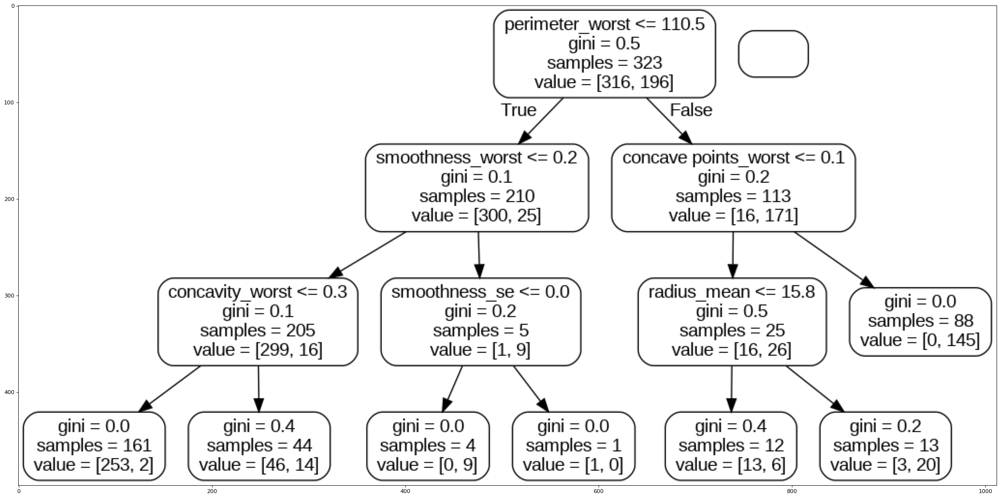

In [15]:
# Visualization of Nodes for the purpose of explainability
import pydot

figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

Interpreting Nodes of a Tree-Based Model
Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as leaf 1.



- **Nodes:** Each box represents a node in the decision tree. The top node, where the decision tree starts, is known as the root node. Each node below the root is called a child node. Nodes that do not split into further nodes are called leaf nodes or terminal nodes.

- **Splits/Criteria:** Inside each node, except for the leaf nodes, there is a condition or criterion that splits the data based on a feature's value. This feature and the condition are selected based on their ability to separate the data into classes as cleanly as possible.

- **Gini Index:** This is a metric that quantifies the purity of the node. A Gini index of 0 represents perfect purity, meaning all samples in the node belong to a single class. As the Gini index approaches 1, the purity decreases

- **Samples:** This indicates the number of samples from the training dataset that reached the node.

- **Value:** This is an array that shows the class distribution of the samples. For binary classification, it would typically show the count of samples from each of the two classes.

- **Leaf Nodes:** The terminal nodes that do not split further. The Gini index here can be 0, which means all samples belong to one class and the prediction would be that class.

### **In this tree:**

- The first split was made on the feature perimeter_worst <= 110.5. If true, it proceeds to the left; if false, it proceeds to the right.
- Subsequent splits are made based on other features such as smoothness_worst, concave points_worst, radius_mean, and so on.
- The tree splits until it reaches a leaf node where no further splits are possible or practical.
- In this visualization, some leaf nodes perfectly classify the samples (Gini = 0.0), while others contain a mix of classes.
- The tree's decisions offer insight into the features that are most informative for the classification task at hand, which, in this case, seems to be related to breast cancer diagnosis.-

In [16]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [18]:
# Print out the feature and importances
[print("Variable: {:30} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: perimeter_worst                Importance: 0.24
Variable: concave points_worst           Importance: 0.24
Variable: concavity_mean                 Importance: 0.17
Variable: area_worst                     Importance: 0.12
Variable: perimeter_mean                 Importance: 0.07
Variable: texture_worst                  Importance: 0.03
Variable: smoothness_worst               Importance: 0.03
Variable: radius_mean                    Importance: 0.02
Variable: area_mean                      Importance: 0.02
Variable: radius_worst                   Importance: 0.02
Variable: smoothness_mean                Importance: 0.01
Variable: concave points_mean            Importance: 0.01
Variable: concavity_worst                Importance: 0.01
Variable: id                             Importance: 0.0
Variable: texture_mean                   Importance: 0.0
Variable: compactness_mean               Importance: 0.0
Variable: symmetry_mean                  Importance: 0.0
Variable: fractal_

## **Getting best model using H2O AutoML**

In [19]:
# Converting Pandas dataframe in H2O dataf
df = h2o.H2OFrame(pandas_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [20]:
# Setting up the data split between training and test dataset.
pct_rows = 0.80
df_train, df_test = df.split_frame([pct_rows])

In [21]:
 # Datatype of all attributes, here the result ("ChronicKidneyDisease") is int hence it can be solved using the regression. If this problem was supposed to solved using the classification
df.types

{'id': 'int',
 'diagnosis': 'int',
 'radius_mean': 'real',
 'texture_mean': 'real',
 'perimeter_mean': 'real',
 'area_mean': 'real',
 'smoothness_mean': 'real',
 'compactness_mean': 'real',
 'concavity_mean': 'real',
 'concave points_mean': 'real',
 'symmetry_mean': 'real',
 'fractal_dimension_mean': 'real',
 'radius_se': 'real',
 'texture_se': 'real',
 'perimeter_se': 'real',
 'area_se': 'real',
 'smoothness_se': 'real',
 'compactness_se': 'real',
 'concavity_se': 'real',
 'concave points_se': 'real',
 'symmetry_se': 'real',
 'fractal_dimension_se': 'real',
 'radius_worst': 'real',
 'texture_worst': 'real',
 'perimeter_worst': 'real',
 'area_worst': 'real',
 'smoothness_worst': 'real',
 'compactness_worst': 'real',
 'concavity_worst': 'real',
 'concave points_worst': 'real',
 'symmetry_worst': 'real',
 'fractal_dimension_worst': 'real'}

In [22]:
#printing shapes
print(df_train.shape)
print(df_test.shape)

(458, 32)
(111, 32)


In [23]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "diagnosis"

    X.remove(y)  # Removing the result frm our predictors data


    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model


In [24]:
# Training AutoML
autoML = autoML(df_train, df_test)

AutoML progress: |
00:20:31.307: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███
00:20:41.509: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
00:20:42.840: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
00:20:46.912: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
00:20:47.180: _response param, We have det

In [25]:
# Leaderbord of AutoML output
autoML[2].leaderboard

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20231204_02030,0.170471,0.0290605,0.0934097,0.122849,0.0290605
GBM_grid_1_AutoML_1_20231204_02030_model_22,0.176036,0.0309886,0.0922584,0.12637,0.0309886
StackedEnsemble_BestOfFamily_3_AutoML_1_20231204_02030,0.179696,0.0322907,0.0997042,0.130132,0.0322907
GBM_grid_1_AutoML_1_20231204_02030_model_15,0.180116,0.0324416,0.0880271,0.128122,0.0324416
StackedEnsemble_AllModels_2_AutoML_1_20231204_02030,0.180833,0.0327006,0.0992713,0.130843,0.0327006
XGBoost_grid_1_AutoML_1_20231204_02030_model_12,0.182876,0.0334438,0.0982454,0.132923,0.0334438
XGBoost_grid_1_AutoML_1_20231204_02030_model_20,0.183621,0.0337168,0.0981551,0.132632,0.0337168
StackedEnsemble_AllModels_3_AutoML_1_20231204_02030,0.183908,0.0338221,0.119873,0.131237,0.0338221
XGBoost_grid_1_AutoML_1_20231204_02030_model_7,0.184046,0.0338729,0.0948063,0.133043,0.0338729
GBM_grid_1_AutoML_1_20231204_02030_model_18,0.184068,0.0338811,0.0940328,0.130951,0.0338811


In [26]:
autoML_model = getBestModel(autoML[2])
print(autoML_model)

1
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20231204_02030_model_22


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    61                 61                          18021                  5            7            6.96721       9             26            18.8361

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.005007568516787796
RMSE: 0.07076417537700695
MAE: 0.03885658776860859
RMSLE: 0.05119822834740045
Mean Residual Deviance: 0.005007568516787796

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.030988615715938684
RMSE: 0.17603583645365703
MAE: 0.09225839410973417
RMSLE: 0.1263696737360214
Mean Residu

# **SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

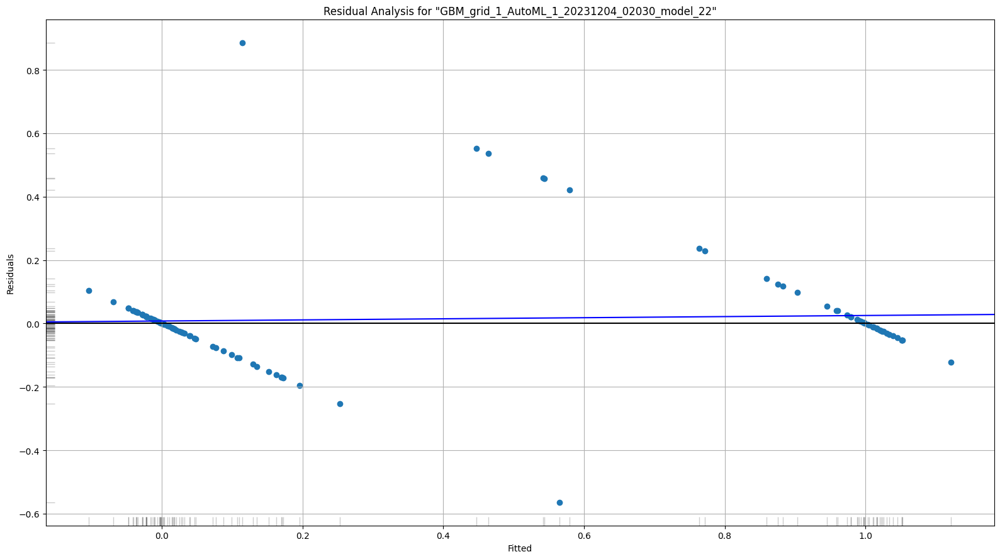

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

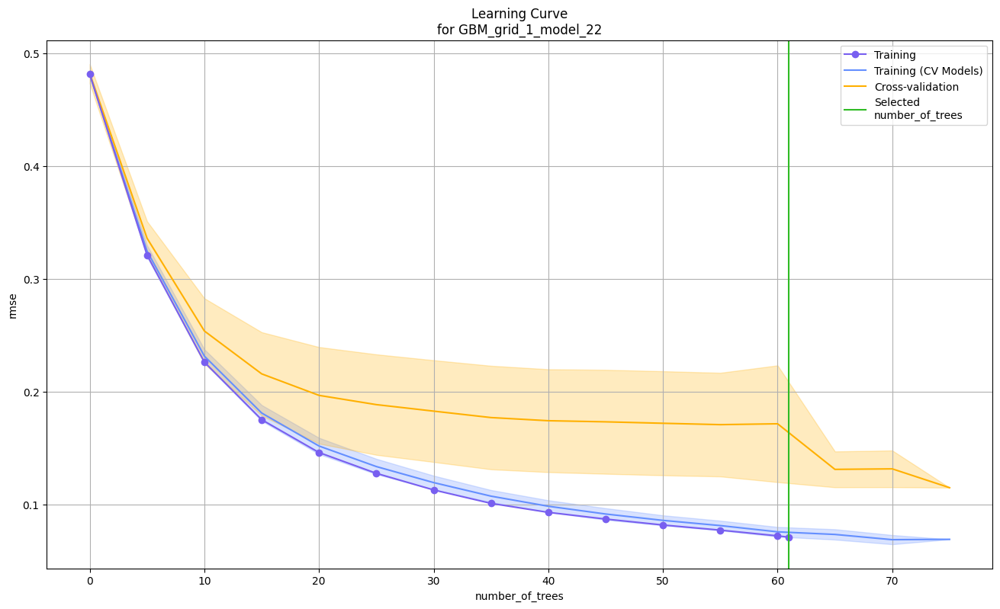

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

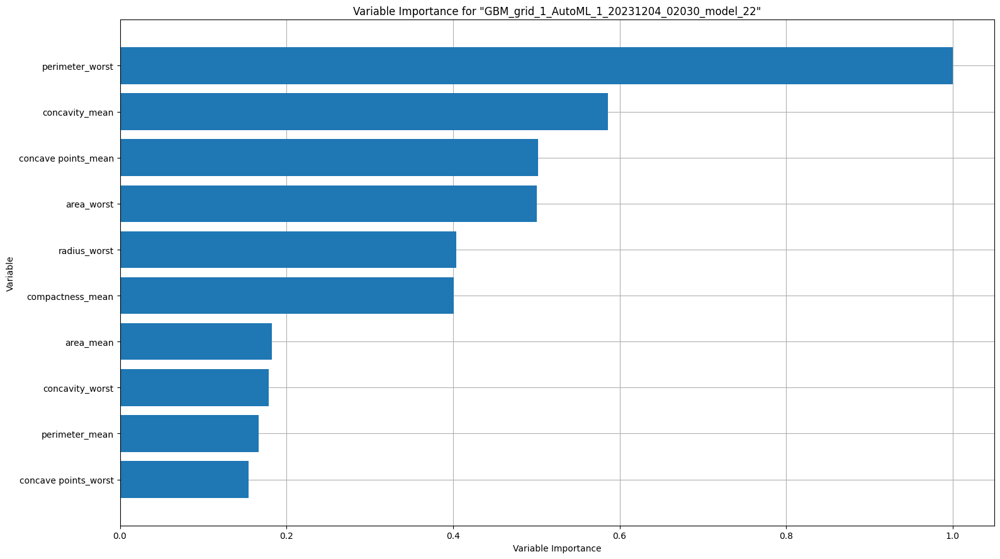

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

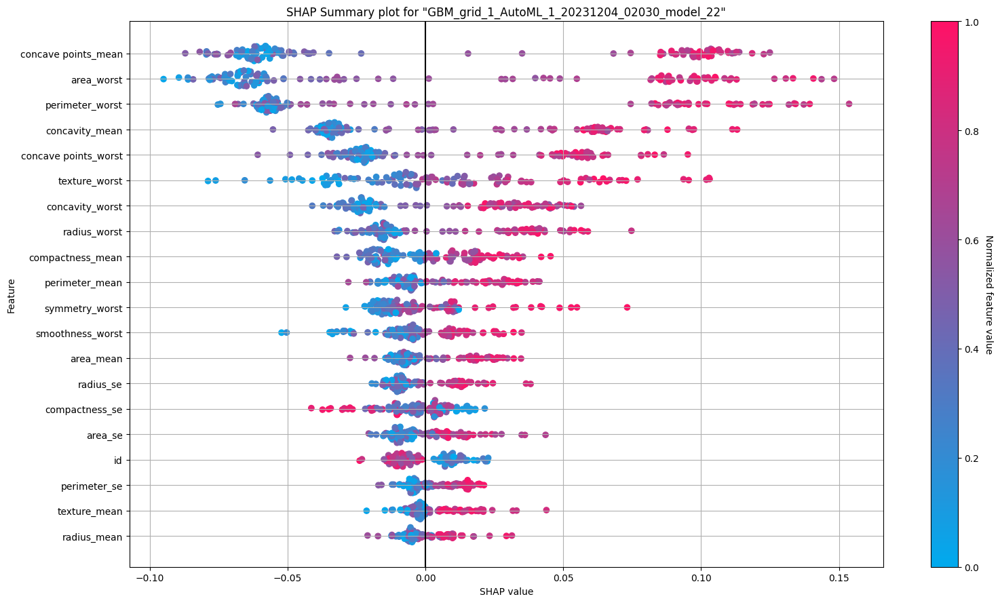

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

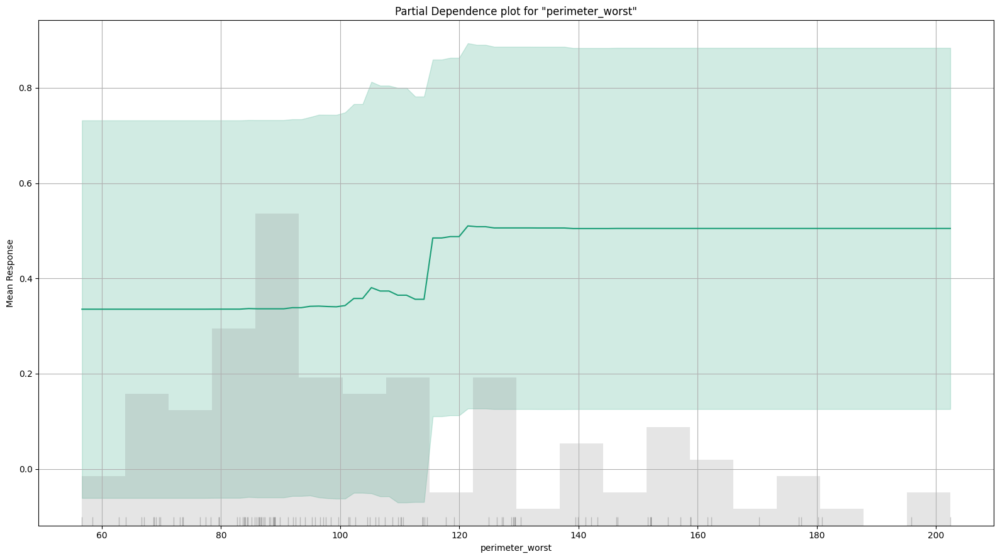

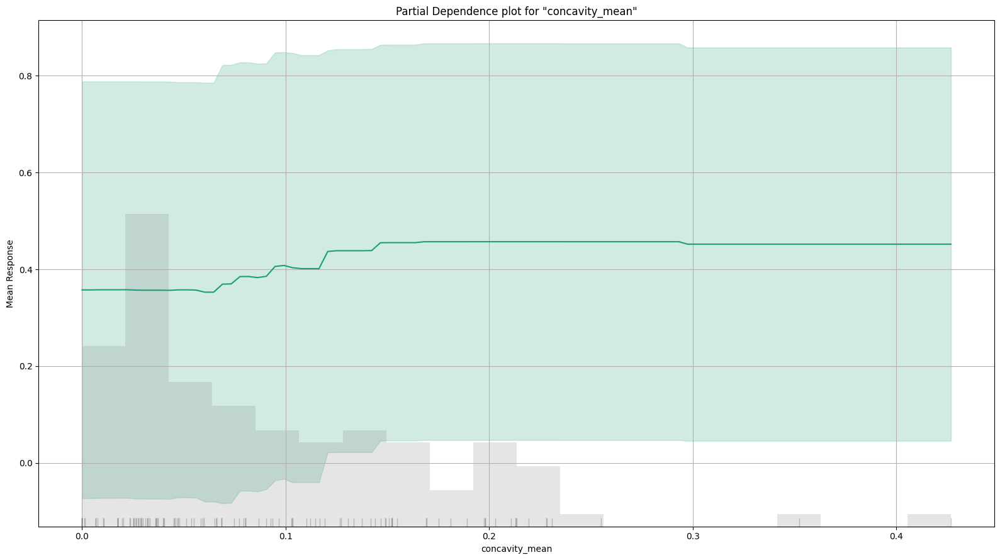

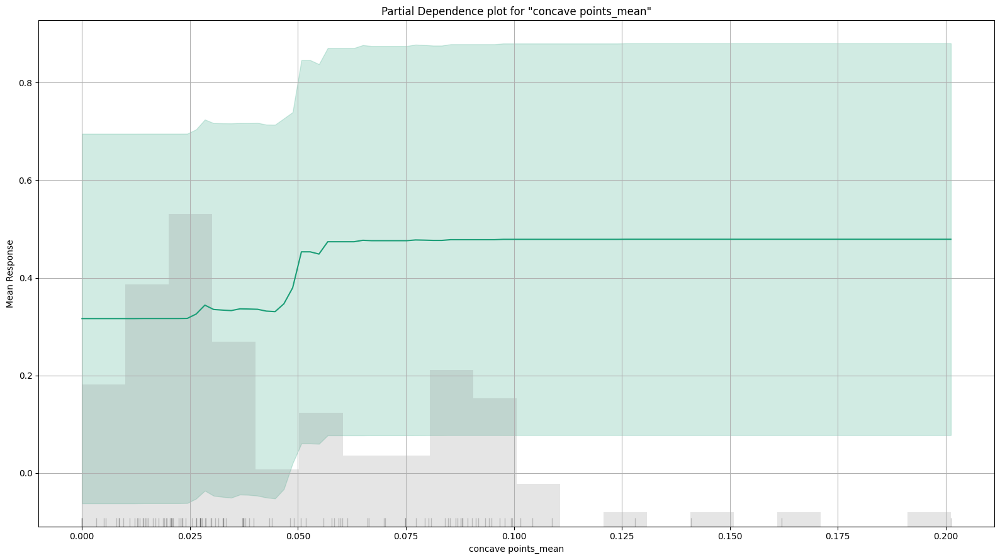

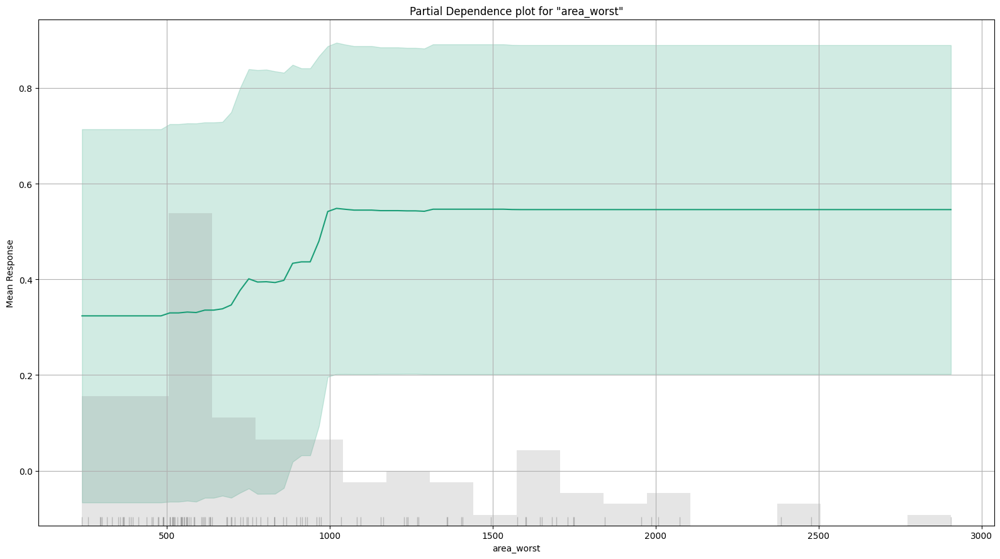

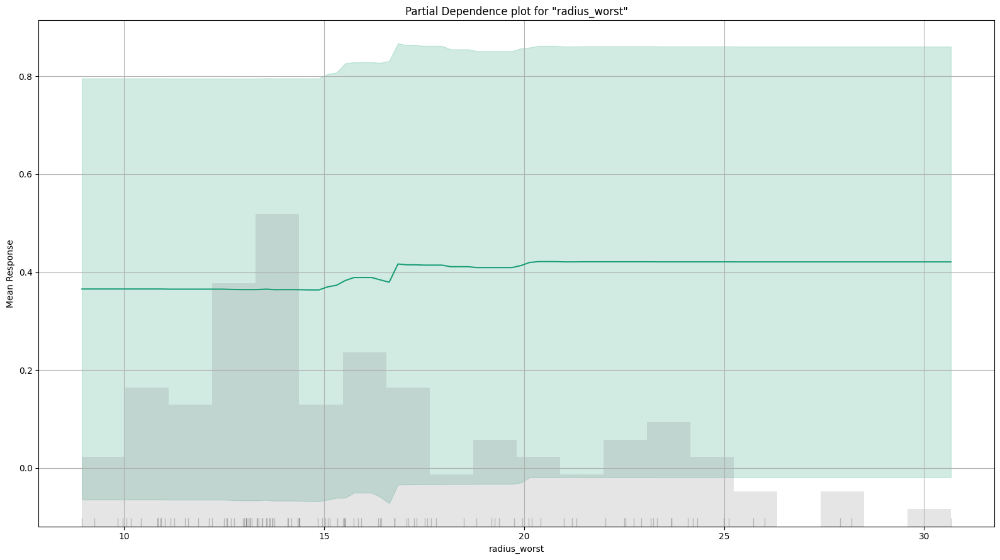

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

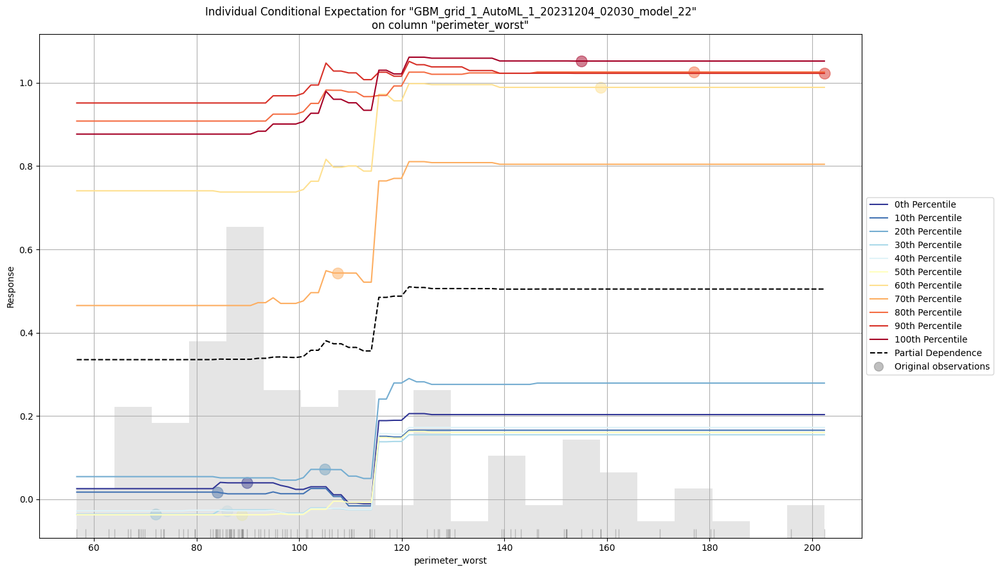

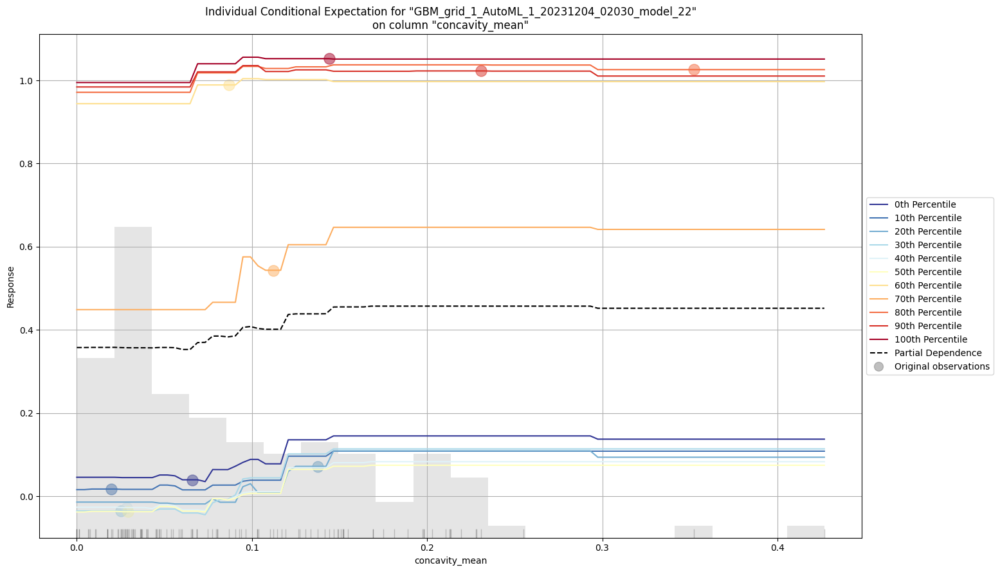

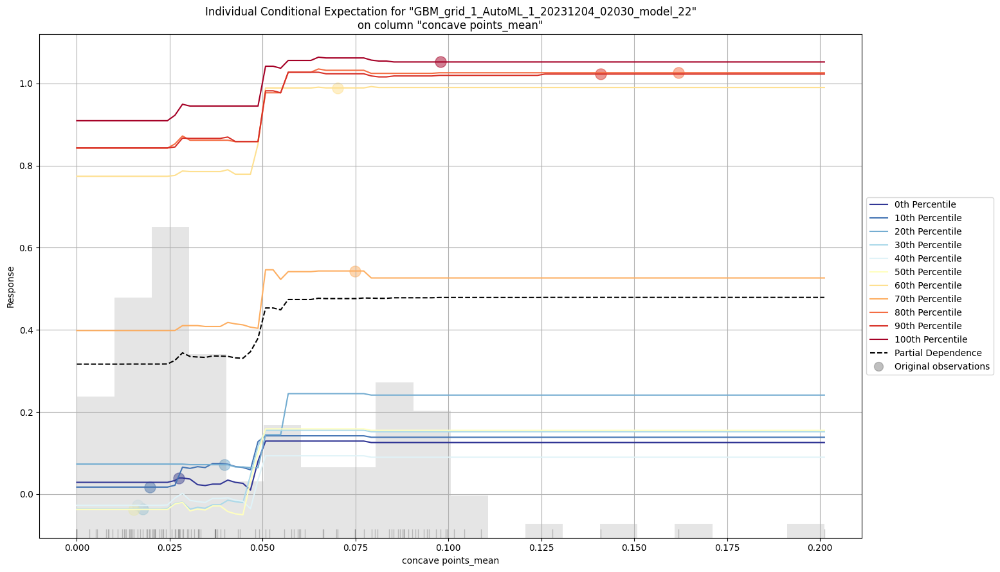

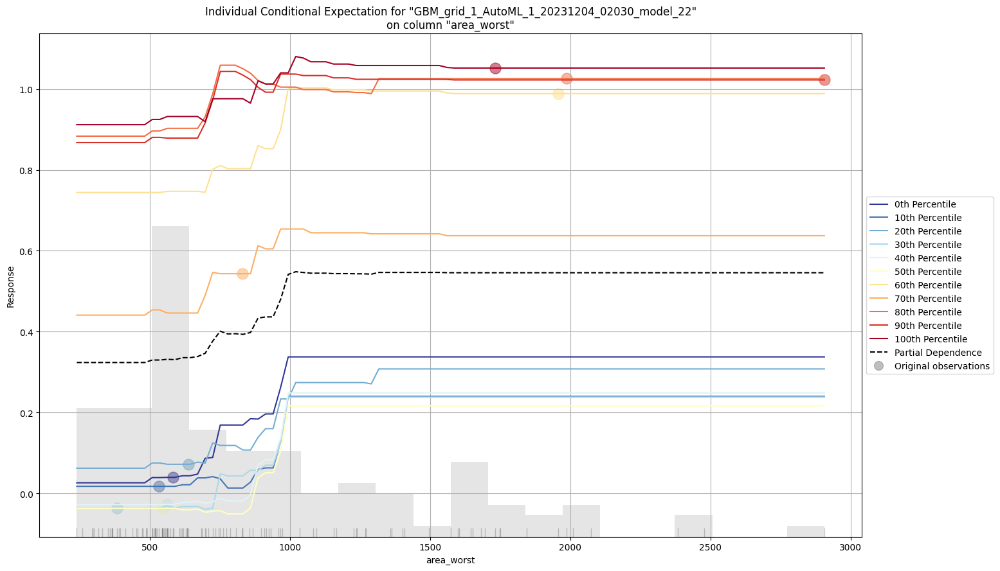

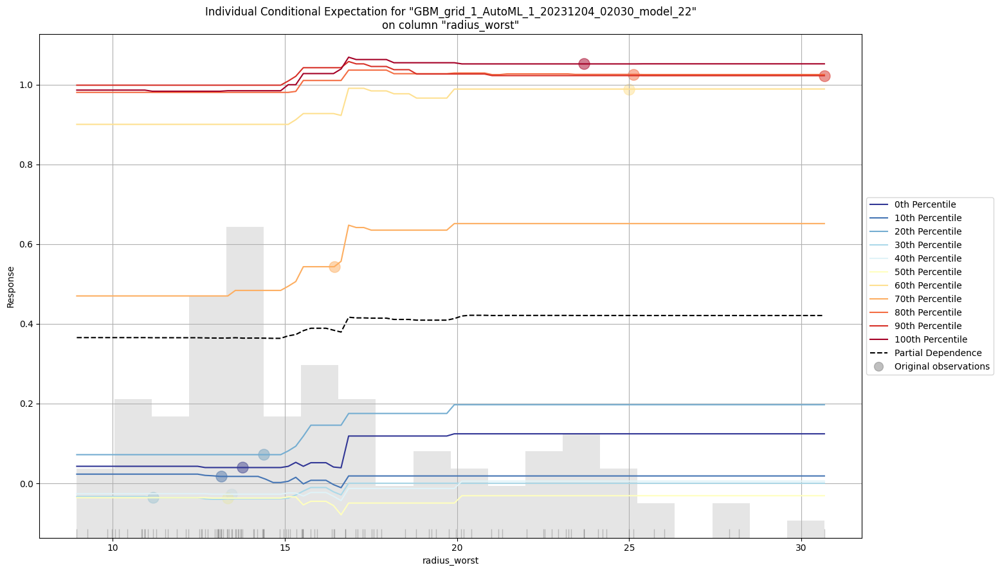

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

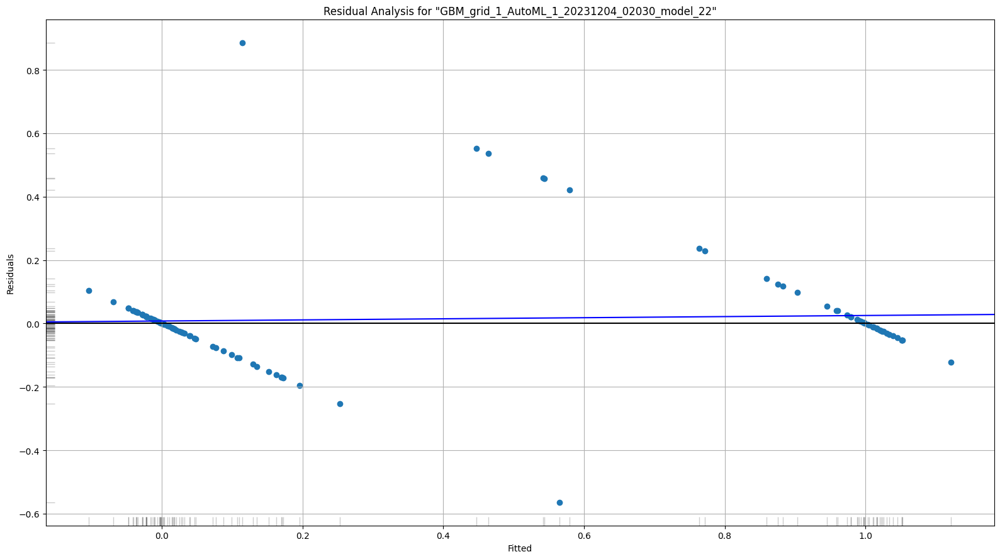

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

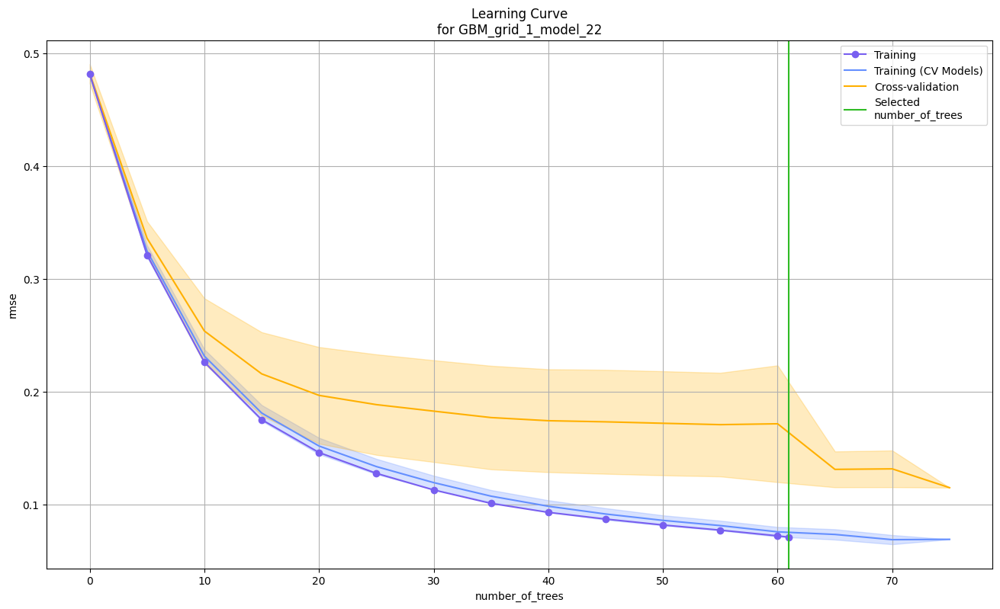

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

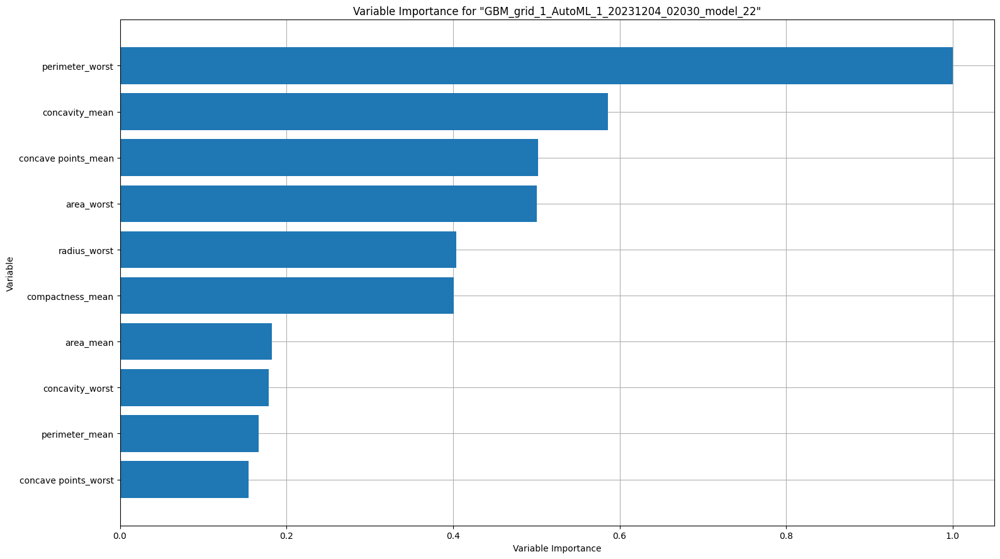

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

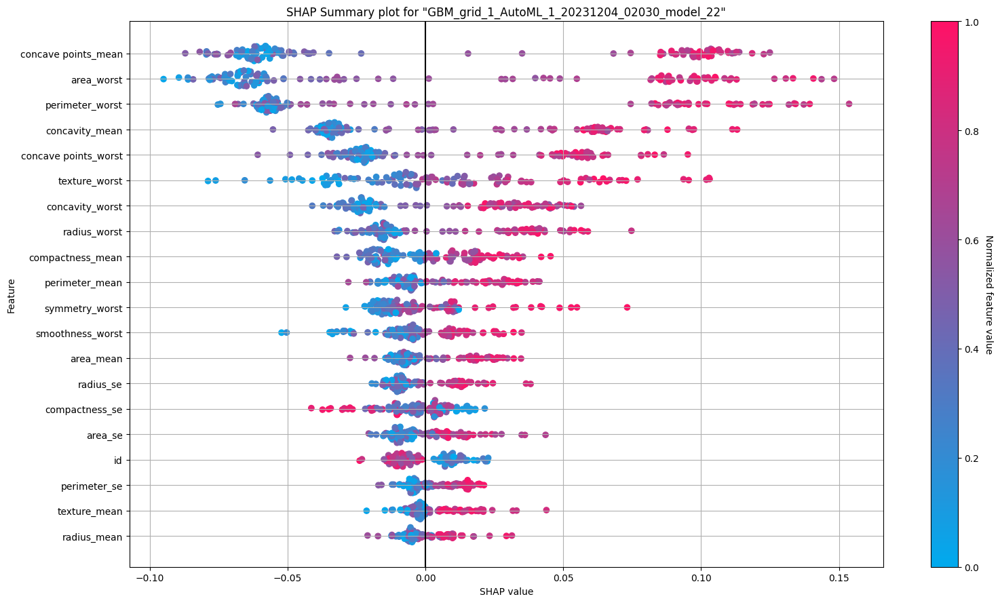

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

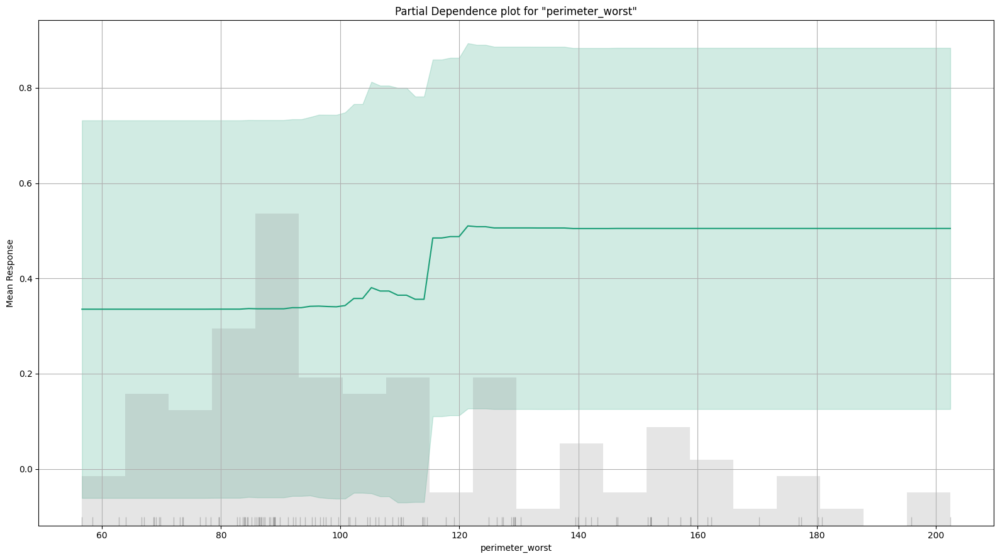

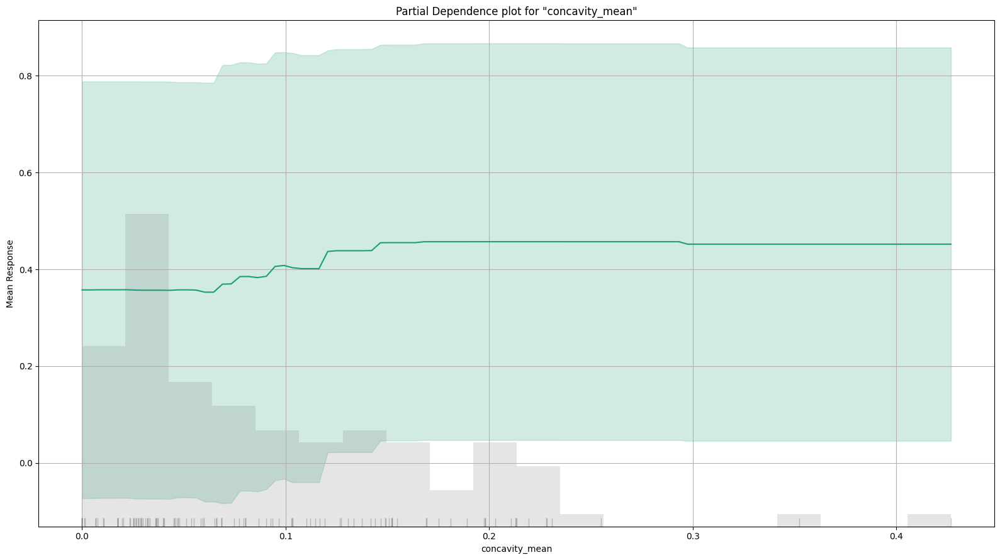

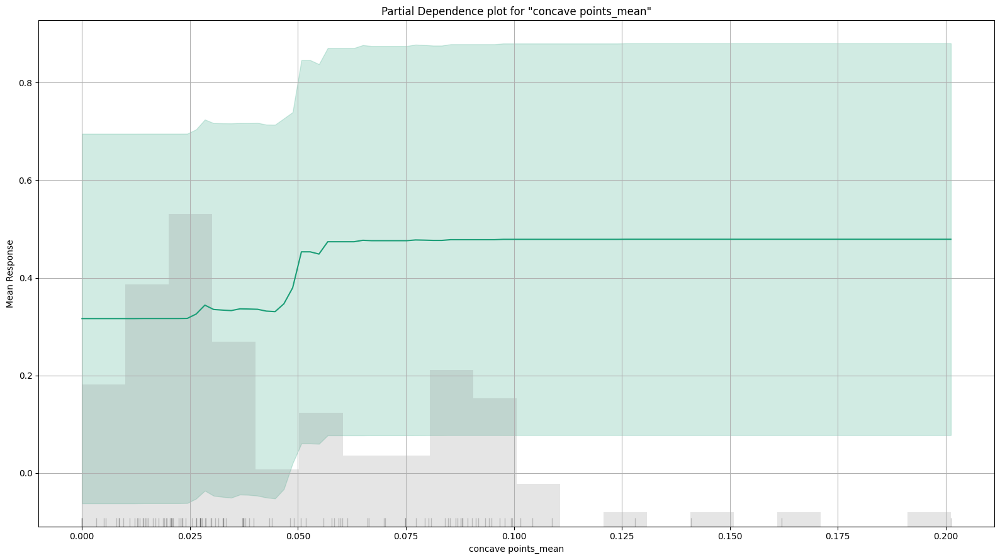

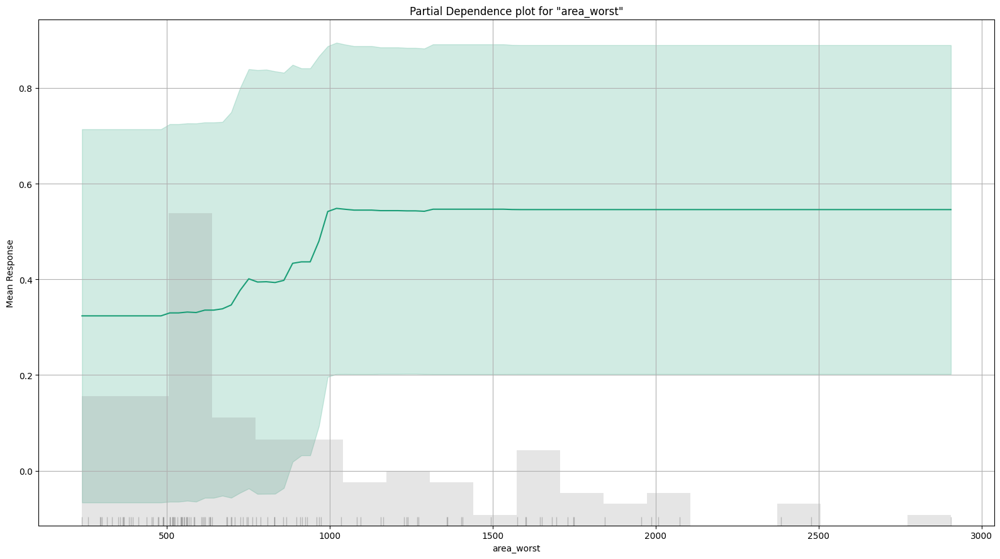

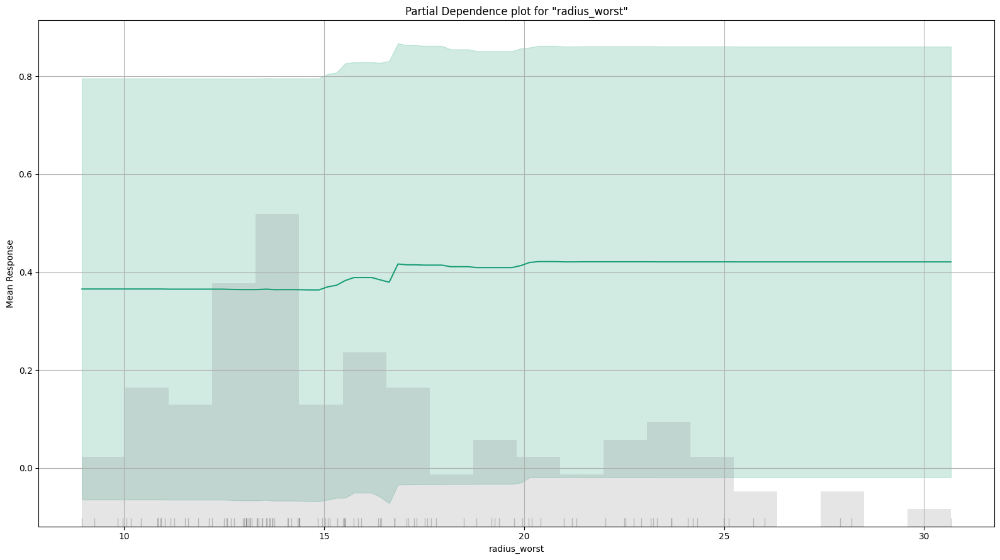

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

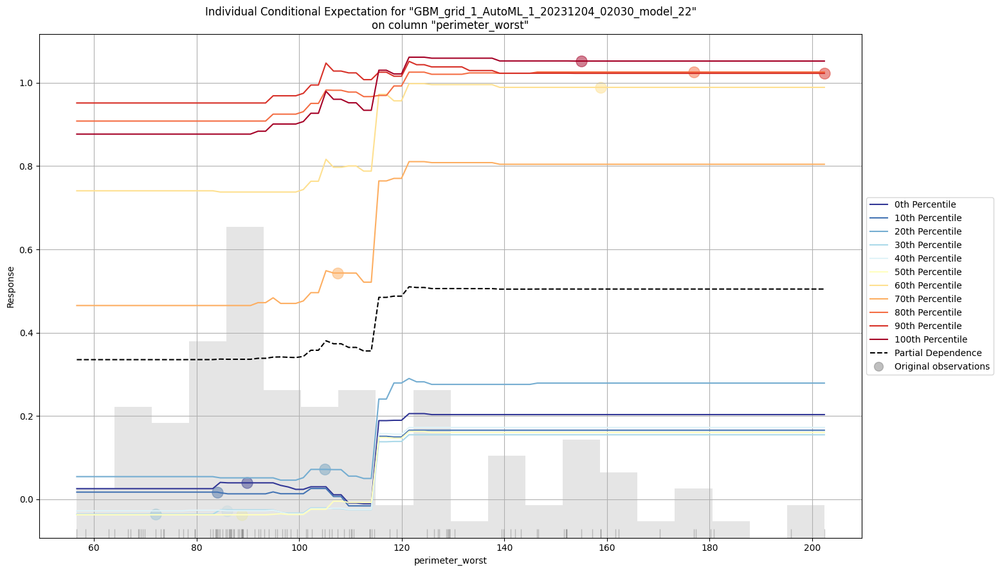

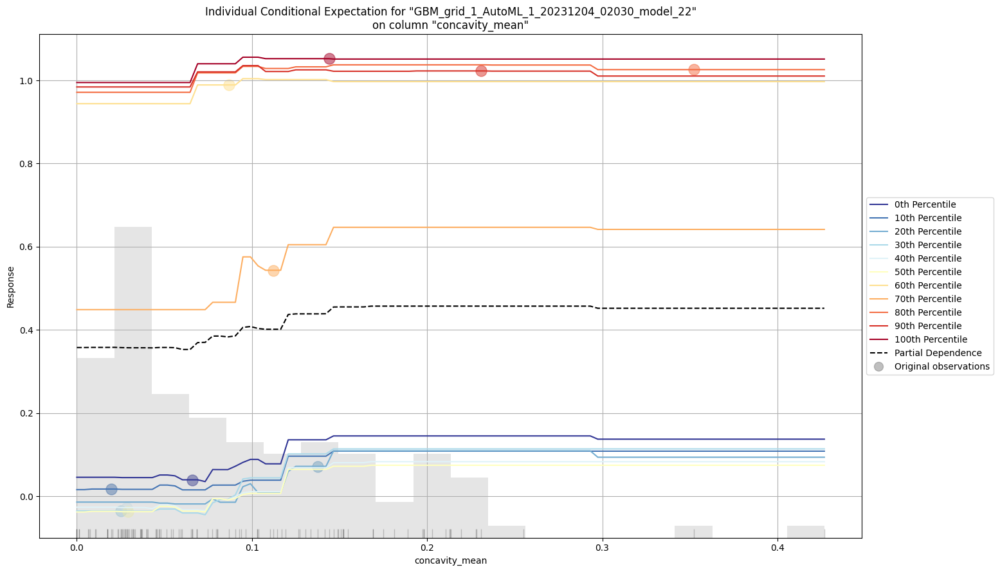

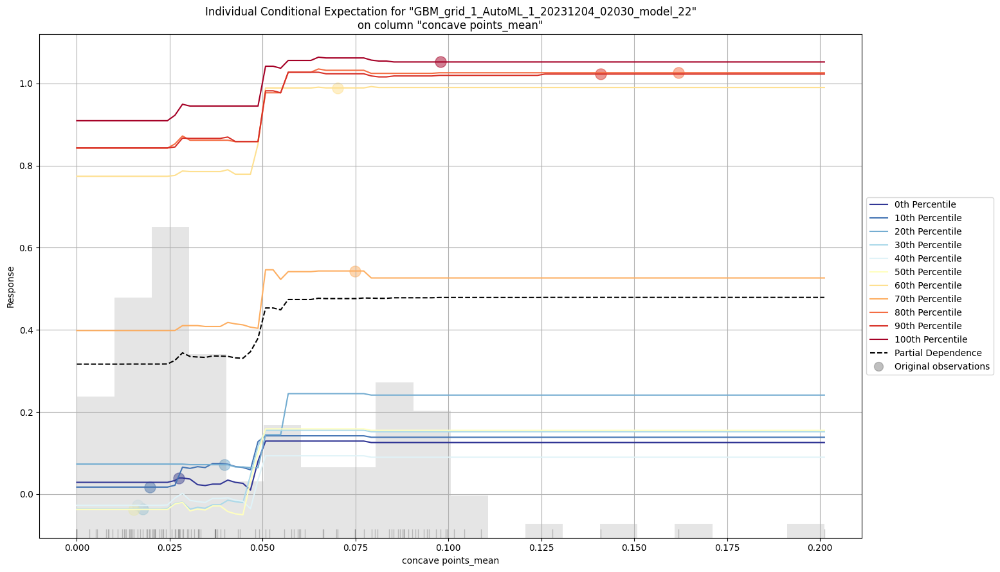

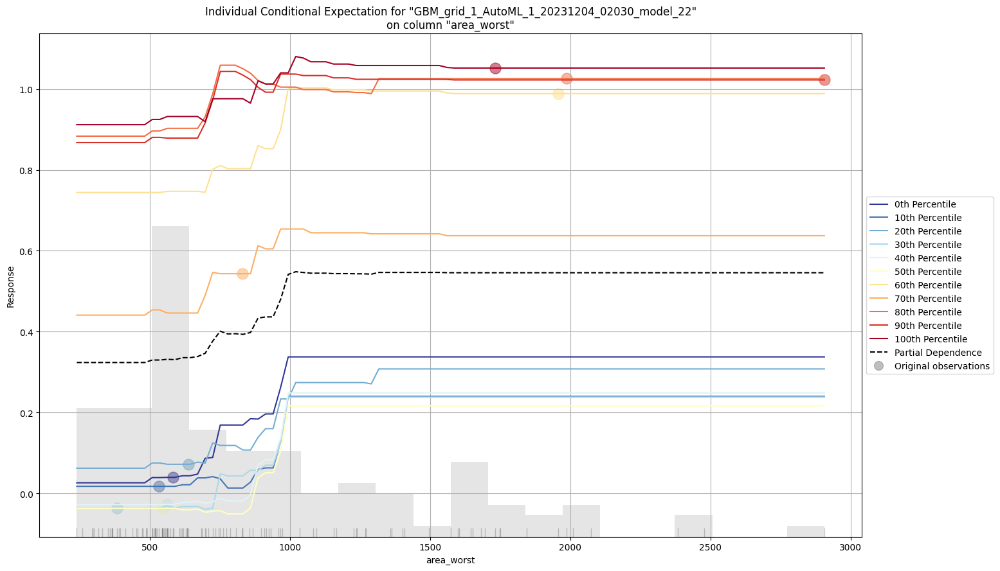

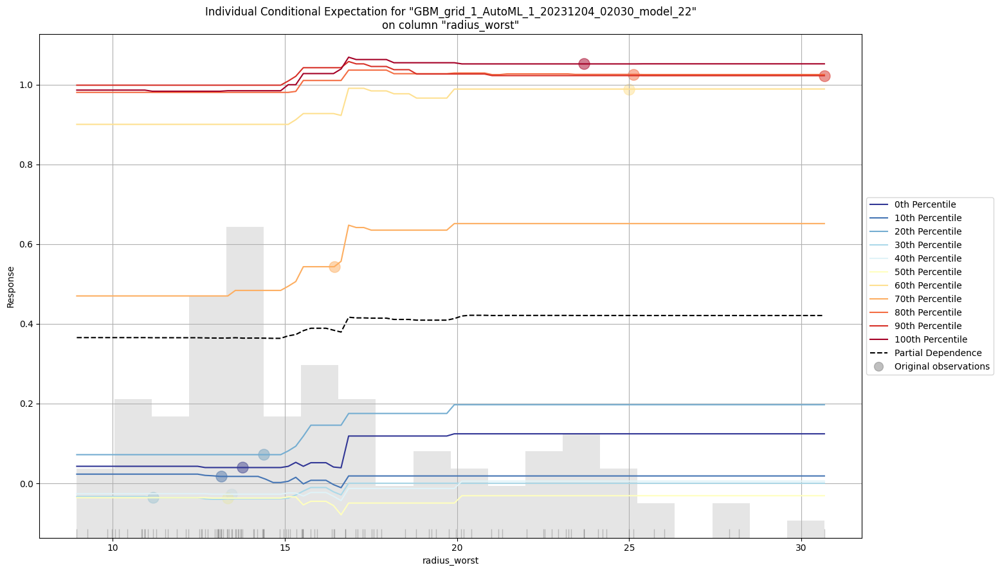

In [27]:
# AutoML Explainability
autoML_model.explain(df_test)

## **Residual plot**

- A residual plot displays the residuals on the vertical axis and the fitted values (or independent variable) on the horizontal axis.
- Residuals are the differences between the observed values and the predicted values from a regression model.

- The horizontal axis is labeled "Fitted", which represents the predicted values from the model.
- The vertical axis is labeled "Residuals", representing the difference between the observed values and the fitted (predicted) values.
- The title of the plotmodel named "GBM_grid_1_AutoML_1_20231204_02030_model_22",implies that this model might be a product of an automated machine learning process and is possibly a Gradient Boosting Machine (GBM) model.
- The blue horizontal line at zero on the residuals axis likely represents the ideal where residuals would be if the model had perfect prediction accuracy.
- The plot shows a clear pattern in residuals which could indicate that the model is not capturing some of the nonlinear aspects of the dataset.
- The residuals decrease as the fitted values increase, suggesting that the model may be systematically underestimating the actual values for lower predictions and overestimating them for higher predictions.


## **Learning Curve**

Here are the key elements happening in the image:

- **Number of Trees:** The horizontal axis indicates the number of trees that have been added to the model. Gradient boosting builds the model in stages, and each tree is built to correct the errors of the previous one.

- **RMSE (Root Mean Square Error):** The vertical axis measures the model's prediction error. RMSE is a common measure of the differences between values predicted by the model and the actual values. Lower RMSE values are better as they indicate less deviation from the actual data.

- **Training Curve (Blue):** This curve shows how the model's performance on the training set improves as more trees are added. Initially, the RMSE decreases sharply, indicating significant learning. As more trees are added, the improvements become marginal, showing that the model is approaching its limit in learning from the training data.

- **Cross-validation Curve (Orange):** This curve represents the model's performance on a validation set not seen during training. The shaded area around the curve could indicate the confidence interval or standard deviation across multiple cross-validation folds. A decreasing trend in RMSE on this curve would typically suggest that the model is generalizing well to new data. The curve starts to flatten as the number of trees increases, indicating diminishing returns on model performance from adding more trees.

- **Optimal Number of Trees (Green Vertical Line):**vThis line shows the selected optimal number of trees where the cross-validation performance is maximized. The choice of this number is likely based on a trade-off between performance and model complexity. Beyond this point, adding more trees might not improve cross-validation performance and could lead to overfitting.

## **PDP for Perimeter worst**

- **Horizontal Axis (perimeter_worst):** This axis shows the range of values for the "perimeter_worst" feature. It represents different measurements or levels of the "perimeter_worst" in the dataset.

- **Vertical Axis (Mean Response):** This axis indicates the mean prediction or response of the machine learning model at different values of "perimeter_worst" while keeping all other features constant.

- **Line Plot:** The line on the graph shows the relationship between the value of "perimeter_worst" and the predicted outcome. If the line is flat, it suggests that the "perimeter_worst" feature has little impact on the predictions. A sloped line, either upward or downward, indicates that the feature has an influence on the model's predictions.

- **Shaded Area:** The shaded area represents the confidence interval around the mean response line. A wider shaded area would suggest greater variance in the predictions at those feature values, while a narrower shaded area indicates more certainty.

- **Histogram:** The histogram at the bottom represents the distribution of the "perimeter_worst" feature values in the dataset. This shows how many observations fall within each range of values for "perimeter_worst".



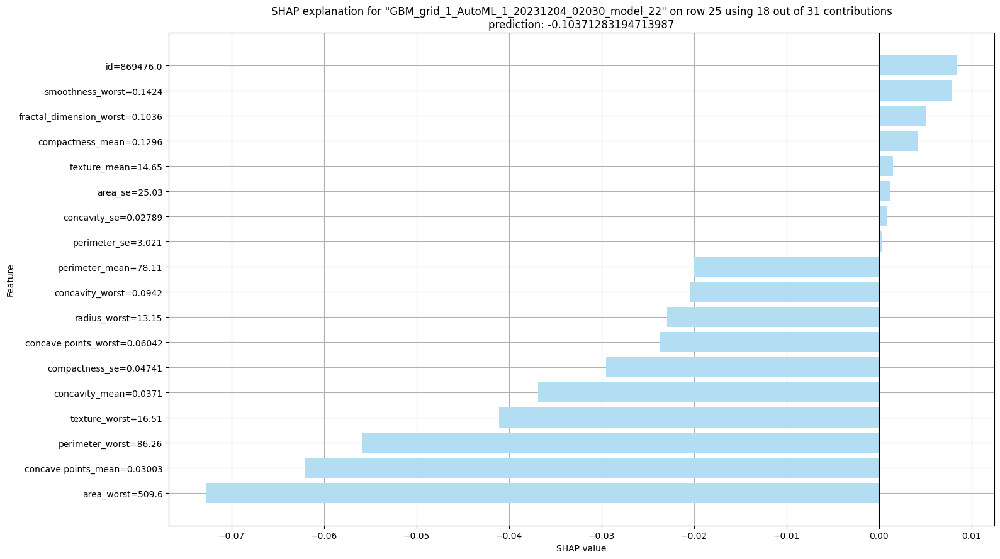

In [28]:
# Getting Best Model
autoML_model.shap_explain_row_plot(
    autoML[1], 25
)  # Lets Analyze the 25th row in Test Data

SHAP values explain the impact of each feature on the model's prediction for an individual instance (row 25 in this case).

- The horizontal axis represents the SHAP values, which quantify the contribution of each feature to the prediction.
- Negative SHAP values indicate that the feature pushed the model's prediction lower, and positive values indicate a push higher.
- Each bar's length corresponds to the absolute SHAP value of that feature, and the direction (left or right from the zero line) indicates whether the feature's effect is to decrease or increase the prediction.
- The features at the bottom of the chart, such as "area_worst", "concave points_mean", and "perimeter_worst", appear to have the largest negative impact on the model's prediction, pushing it lower.




## **SHAP Analysis for Linear and Tree-Based Models**

- SHAP (SHapley Additive exPlanations) is a method for interpreting the output of machine learning models, and it provides insights into the contribution of each feature to the model's prediction for a particular instance. SHAP values measure the impact of each feature on the model's output for a particular instance, and they provide a unified measure of feature importance that is consistent across different models.

- **For linear models**, SHAP values can be calculated using the coefficients of the model as written in code below. The SHAP value for a particular feature is calculated as the product of the coefficient for that feature and the difference between the prediction with that feature included and the prediction with that feature excluded.

- **For tree-based models**, SHAP values can be calculated using the tree structure and the feature values of a particular instance. The SHAP value for a particular feature is calculated as the difference between the average prediction of the model with that feature present in the tree and the average prediction of the model with that feature absent in the tree, over all possible subsets of features.

PermutationExplainer explainer: 513it [00:36, 13.95it/s]                         


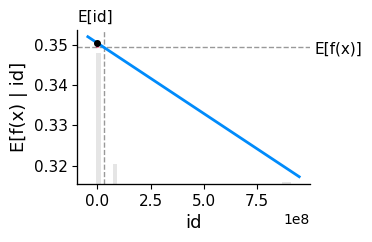

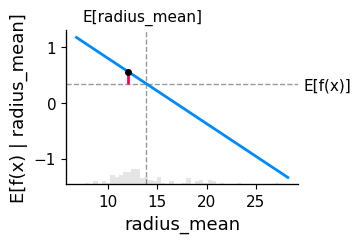

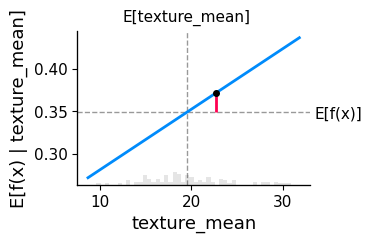

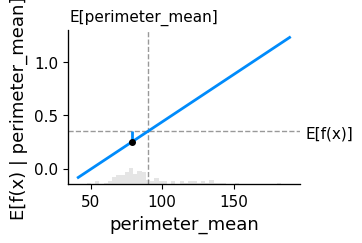

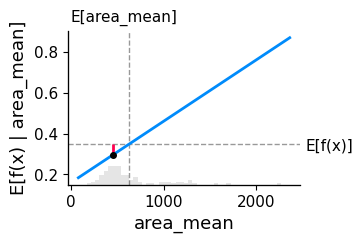

...

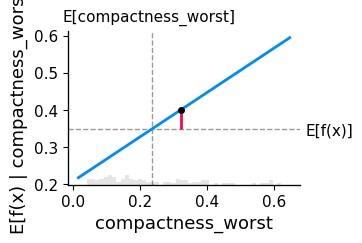

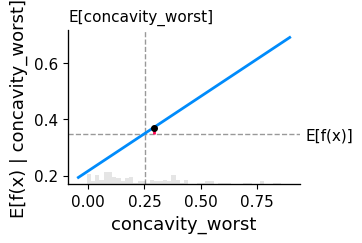

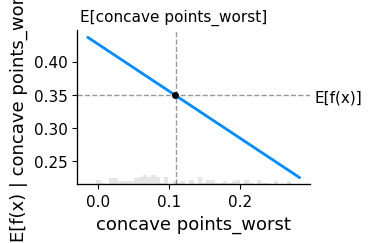

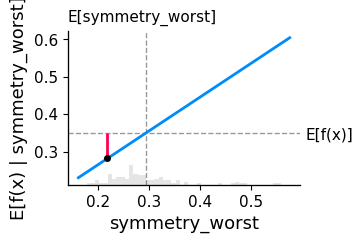

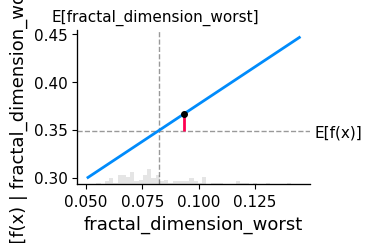

In [29]:
import matplotlib.pyplot as plt
#This code is performing a SHAP partial dependence plot for a linear model

linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)

for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 31
    fig, ax = plt.subplots(figsize=(3,2)) # Create a new figure with the desired size
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax # Pass the axes of the new figure to the function
    )

## **Analysis:**

- The above code generates a partial dependence plot for each feature in the x_train dataframe using the SHAP values calculated for the linear model. The resulting plots show the effect of each feature on the model's prediction for a single sample

- Since the focus is on generating partial dependence plots for each feature to visualize the marginal effect of each feature on the model's prediction, ICE plots are not necessary and can be computationally expensive to generate.

- Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.


- The red line on the plot - When we give a sample as an input  as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

PermutationExplainer explainer: 513it [00:40, 10.28it/s]


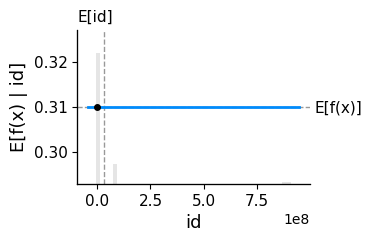

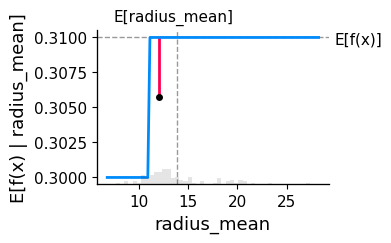

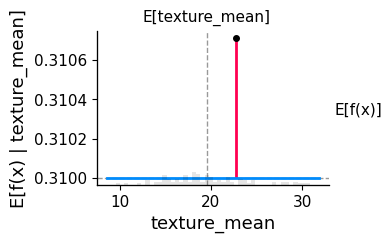

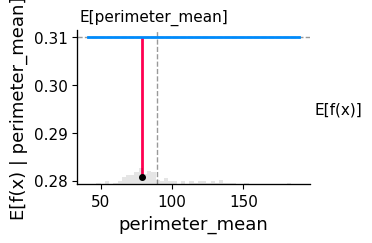

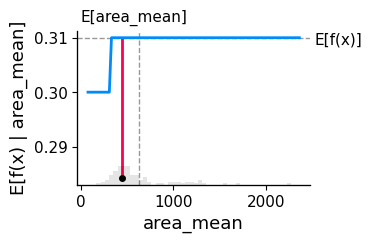

...

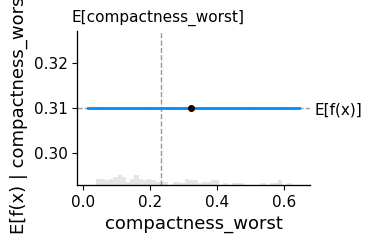

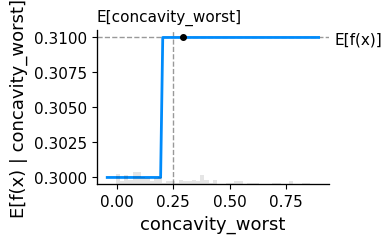

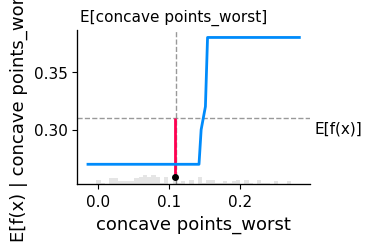

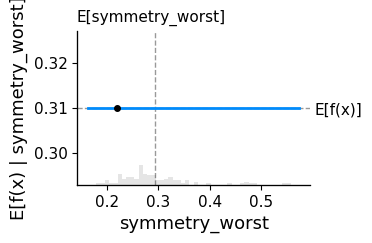

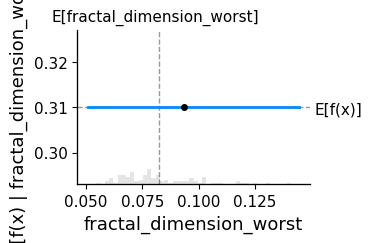

In [37]:
import pandas as pd
import shap
import matplotlib.pyplot as plt

# Assuming y_train is your diagnosis column
y_train_encoded = y_train.replace({'M': 1, 'B': 0})

# Now fit the RandomForestClassifier with the encoded y_train
tree_model = RandomForestClassifier(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train_encoded)


tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 31
    fig, ax = plt.subplots(figsize=(3,2)) # Create a new figure with the desired size
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax
    )

## **Analysis**

- This code generates a partial dependence plot for each feature in the x_train dataframe using the SHAP values calculated for the tree-based model. The resulting plots show the effect of each feature on the model's prediction for a single sample.

- __Note:__ The tree_model object is assumed to be a tree-based model, such as a decision tree, random forest, or gradient boosting machine. Tree-based models have a different internal structure compared to linear models, and SHAP values for tree-based models are calculated differently. The tree_explainer object is designed to handle these differences and calculate SHAP values for tree-based models.



# **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

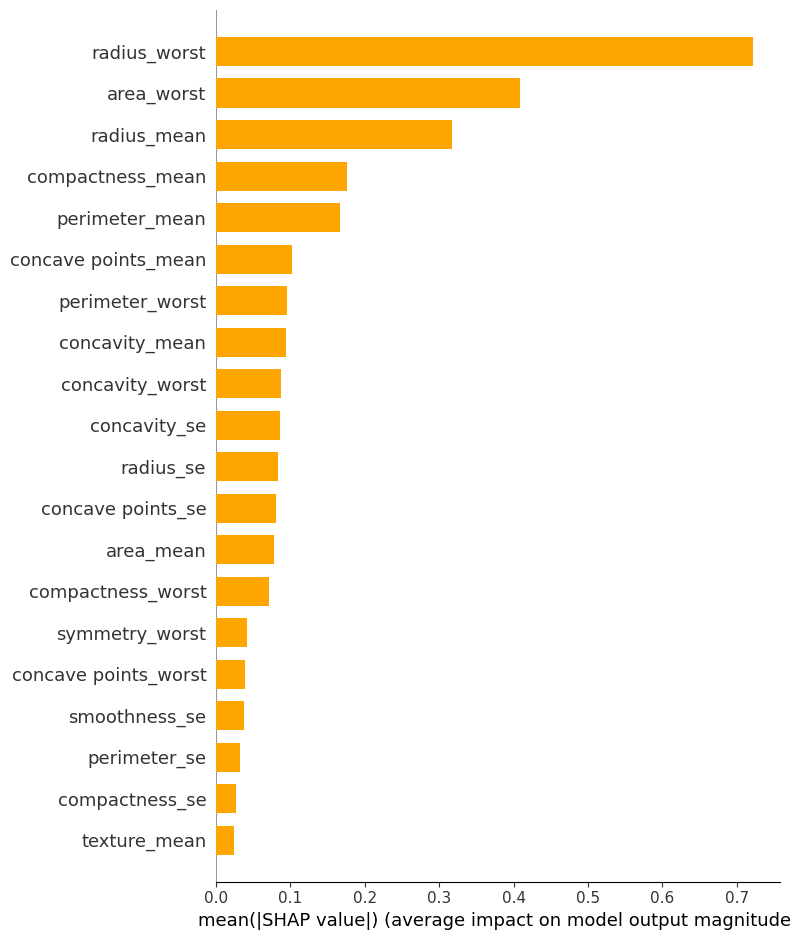

In [38]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="orange")

### **From the top of the chart:**

- The feature **"radius_worst"** has the highest mean absolute SHAP value, suggesting it has the most significant average impact on the model's predictions.
- **"area_worst"** and **"radius_mean"** also have large mean absolute SHAP values, indicating they are important features for the model's predictions.
- Other features such as **"compactness_mean," "perimeter_mean,"** and **"concave points_mean"** have a moderate impact.
- Features towards the bottom of the chart like **"compactness_se,"** **"texture_mean,"** have lower mean absolute SHAP values, suggesting they have a smaller average impact on the model's output.

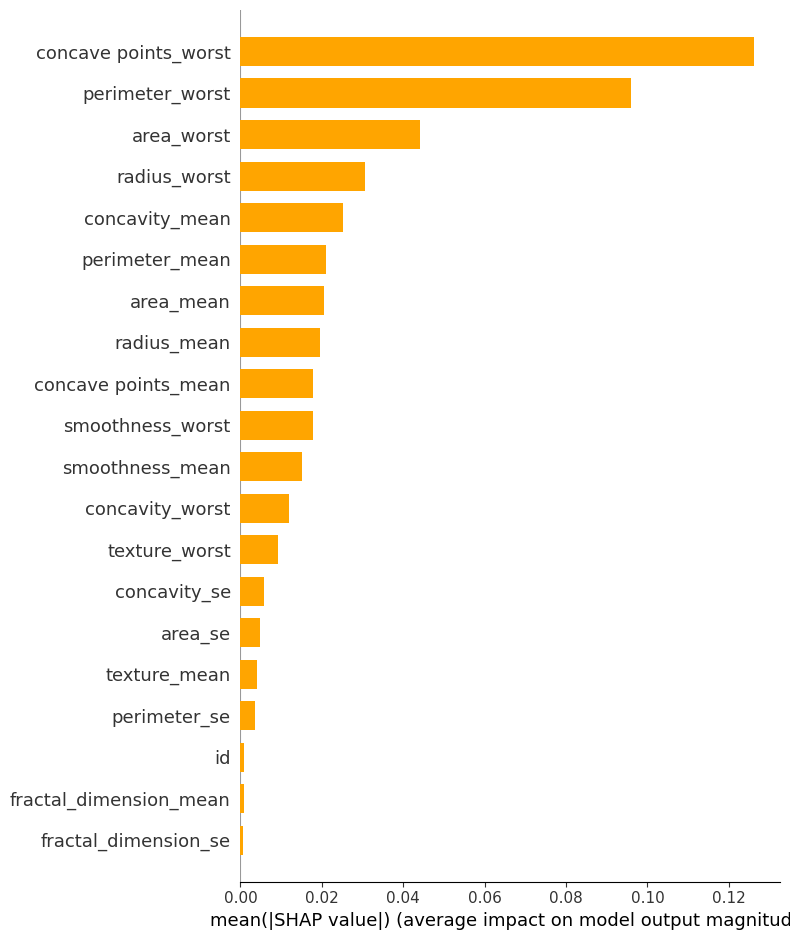

In [39]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="orange")

### **From the top of the chart:**

- The bars are oriented horizontally with the feature names on the y-axis and the mean absolute SHAP values on the x-axis.

- The length of each bar represents the average impact of the corresponding feature on the model's output, with longer bars indicating a greater impact.

- Features like **"concave points_worst", "perimeter_worst"**, and **"area_worst"** are shown to have the most significant positive impact on the model's predictions, as indicated by their longer bars.

- **"radius_worst" and "concavity_mean"** are also prominent features, although to a slightly lesser extent than the top three.

- The features **"fractal_dimension_mean" and "fractal_dimension_se"** at the bottom have the least average impact on model output magnitude, as reflected by their shorter bars.

## **Interpret the summary plot for the Linear and Tree-based model**

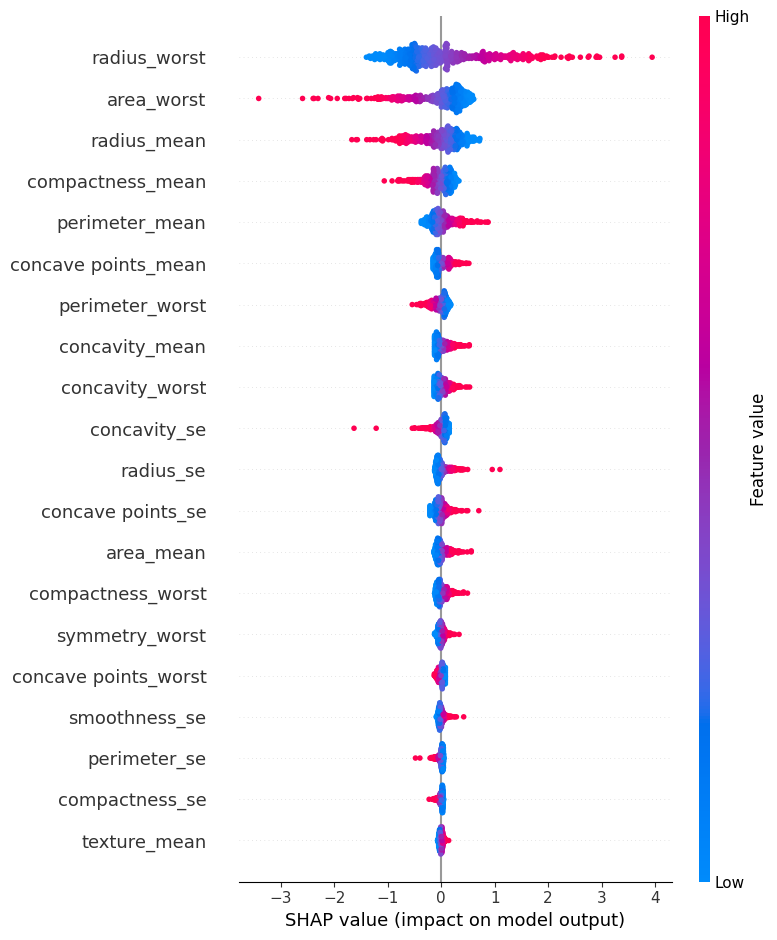

In [40]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

## **Shapley Value (impact on model value)**

- Each point represents a SHAP value for a feature and an instance. The position on the x-axis indicates the impact of the feature on the model's output.
- Points to the right of the vertical center line indicate an increase in the prediction, while points to the left indicate a decrease.
- The color represents the value of the feature from low (purple) to high (red), helping to visualize the correlation of the feature value to its impact on the prediction.
- The features are listed on the y-axis, and they are sorted by the sum of SHAP value magnitudes over all samples. Features at the top of the plot have more influence on the model output.
- **"radius_worst"**, **"area_worst", and "radius_mean"** are at the top, indicating they are key drivers of model prediction.
- The spread of the points for each feature shows the distribution of the impacts. For instance, **"radius_worst" and "area_worst"** have a wide distribution of SHAP values, suggesting they have varying effects on different predictions.
- The plot shows both **positive and negative** relationships between the features and the target, and how the magnitude and direction of the feature's effect can vary across the data set.

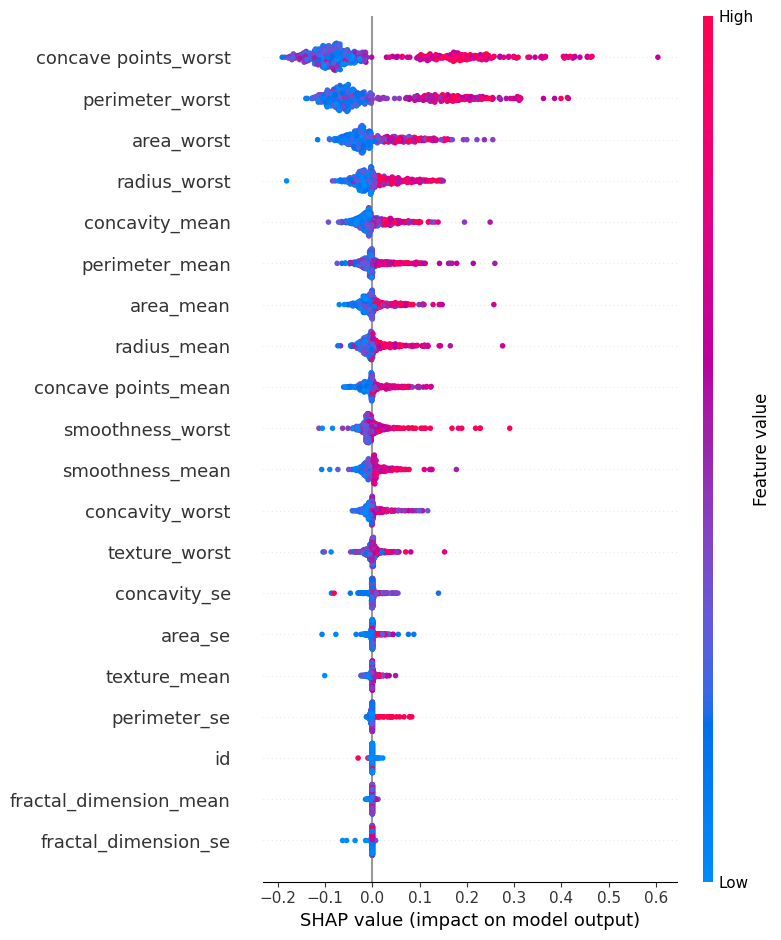

In [41]:
# SHAP summary for Tree Model
shap.summary_plot(tree_shap_values, x_train)

- The y-axis lists the features used in the model, ordered by the impact they have on the model output.

- The x-axis shows the SHAP values, representing the impact on the model output.

- **Positive SHAP values** indicate an increase in the prediction, while negative values indicate a decrease.

- Each dot represents the SHAP value for a feature for an individual prediction.

- The color of the dots indicates the value of the feature: high values in red and low values in blue.

- Features like **"concave points_worst" and "perimeter_worst"** at the top have a cluster of dots primarily on the positive side, suggesting that higher values of these features generally have a positive effect on the model's prediction.

- The spread of the dots horizontally indicates the variability of the impact that each feature has across different predictions.

- Features at the bottom, like **"fractal_dimension_mean"** and **"fractal_dimension_se,"** appear to have less impact on the model output, as indicated by the concentration of dots closer to the zero line on the SHAP value axis.


## **Interpreting SHAP dependence plot for Linear and Tree-based model**

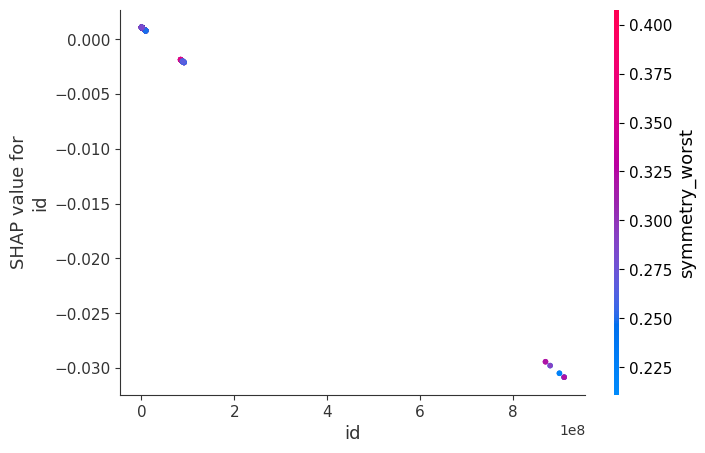

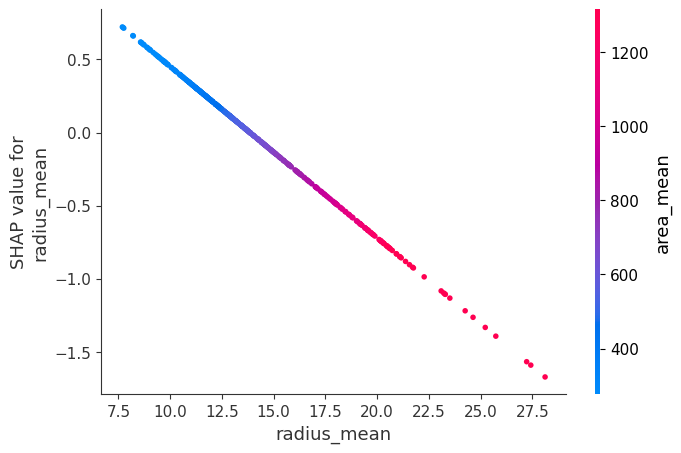

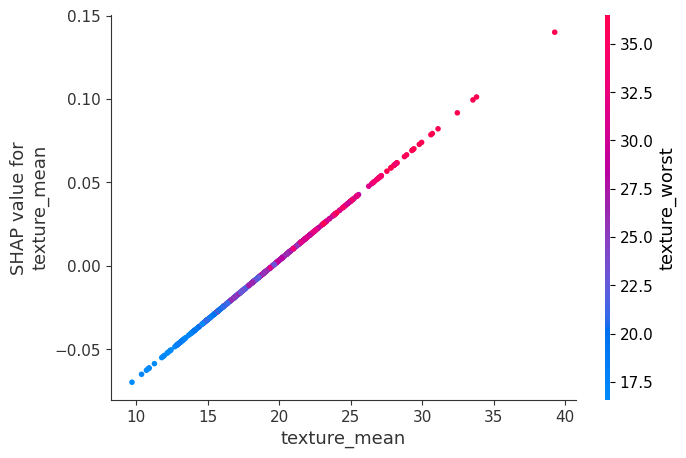

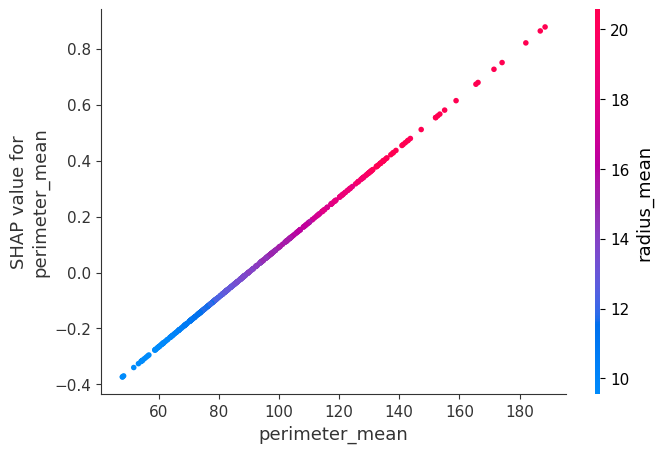

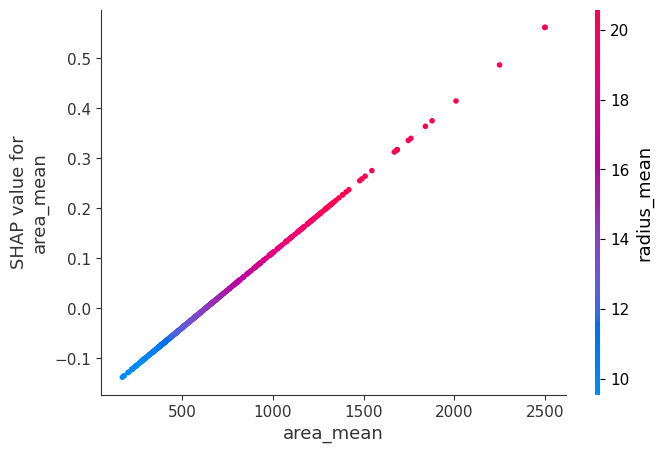

...

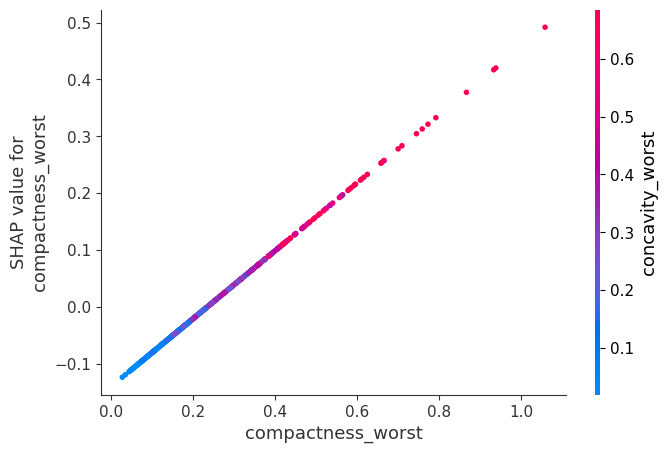

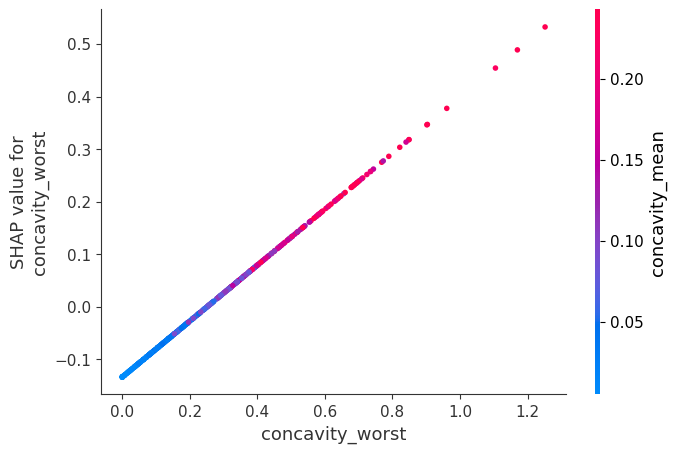

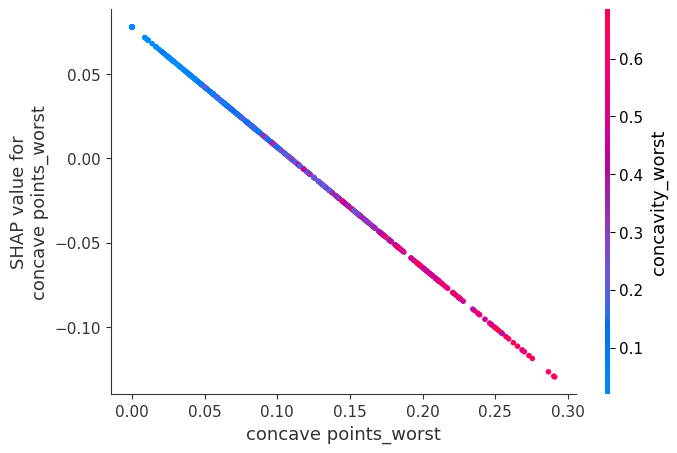

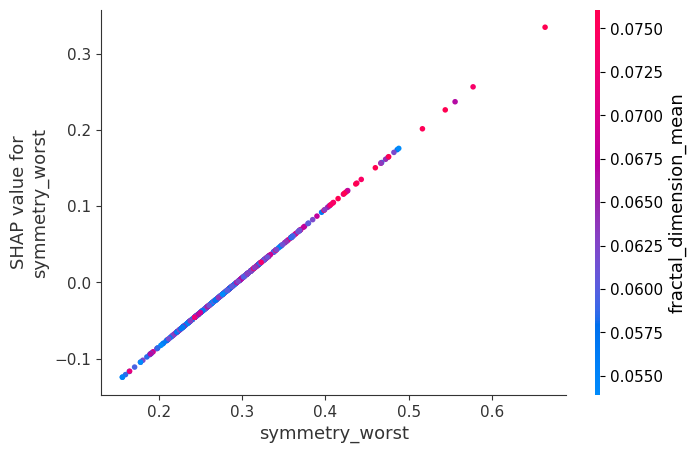

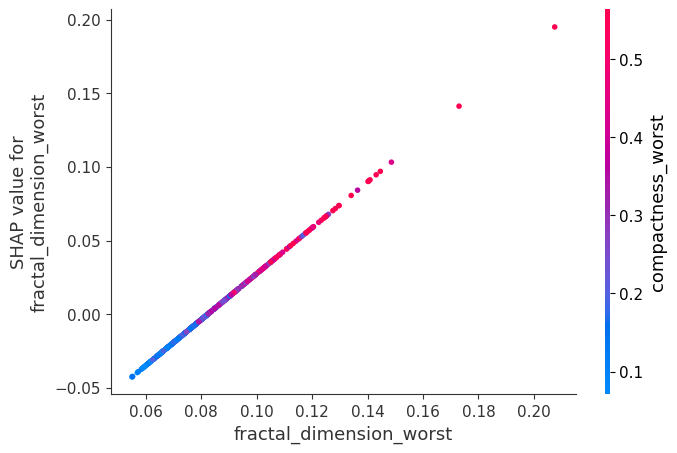

In [42]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

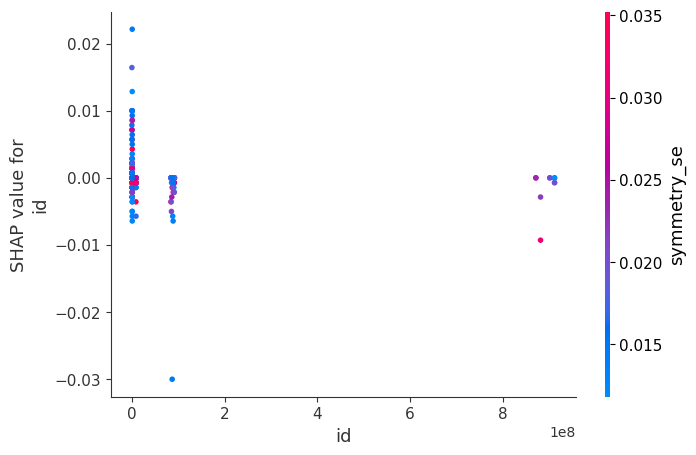

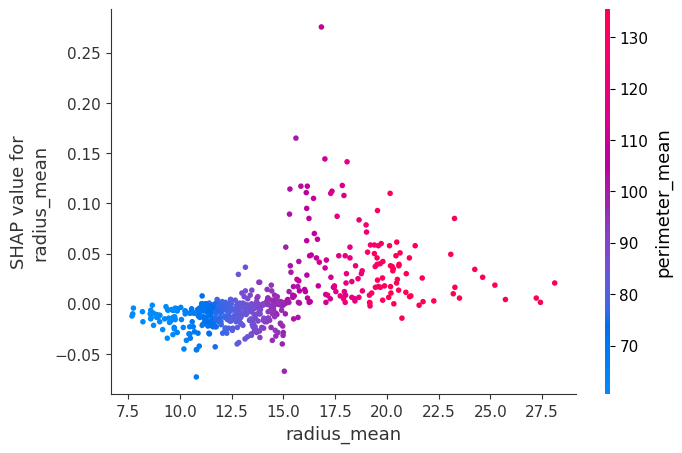

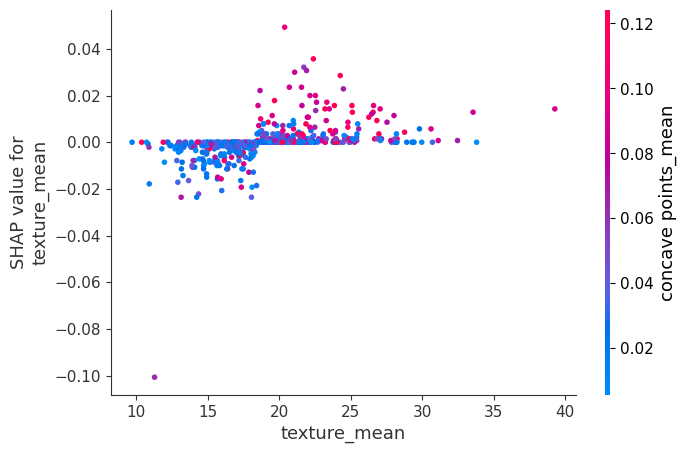

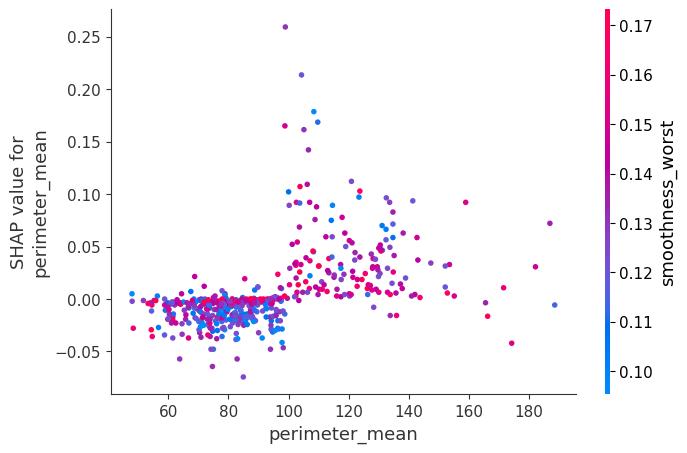

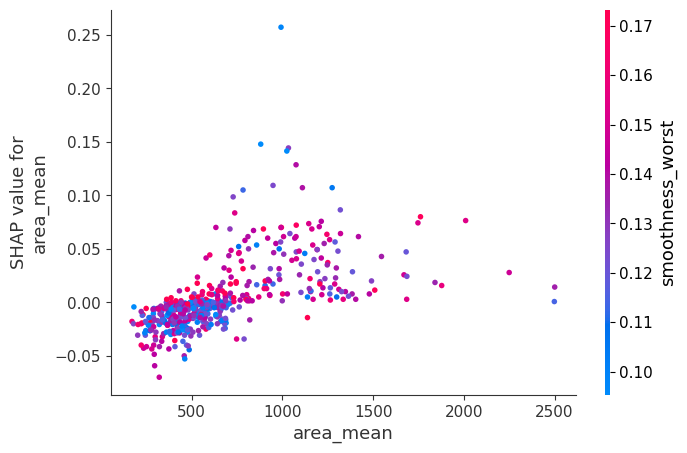

...

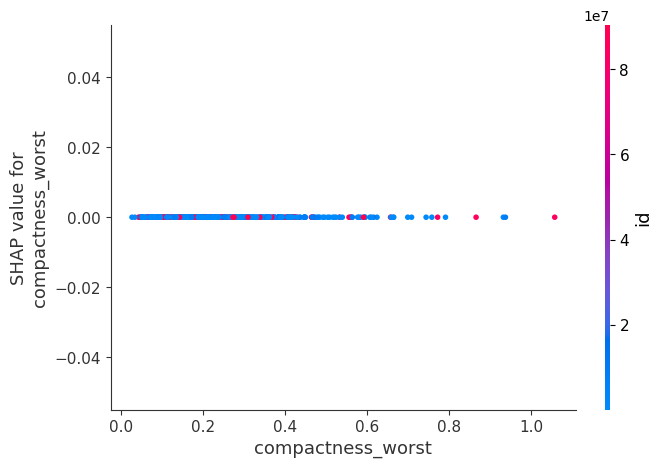

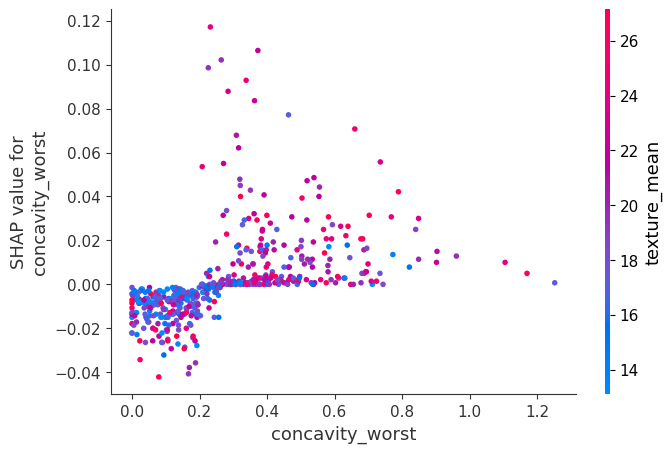

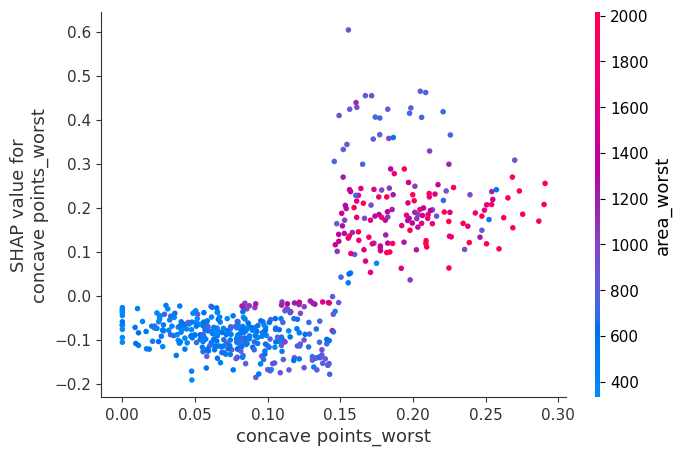

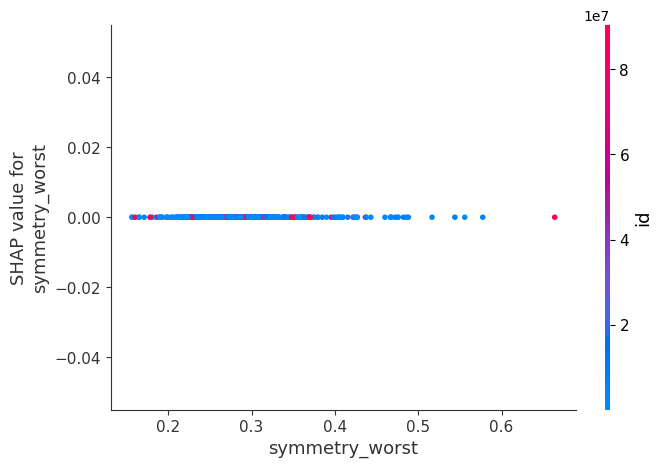

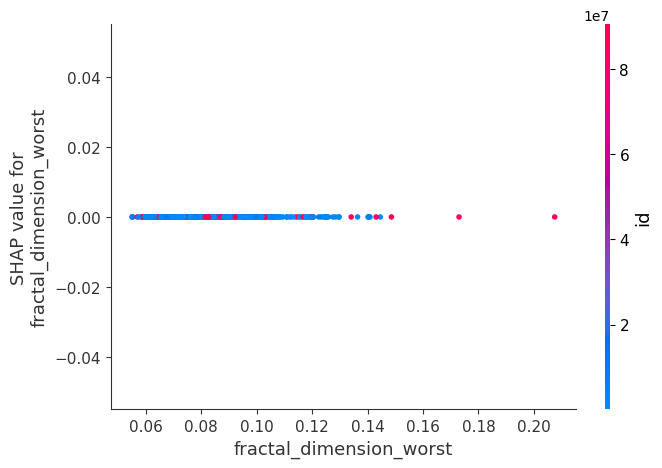

In [43]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

## **Observations**



## **LIME (Local Interpretation Model-Agnostic Explanation) Analysis**

In [57]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [58]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

X does not have valid feature names, but LinearRegression was fitted with feature names


Prediction :  [0.38743008]
Actual :      B


X does not have valid feature names, but LinearRegression was fitted with feature names


## **Code Walk through**

The above code loads a sample data point from x_test and y_test, makes a prediction using the linear_model, and generates an explanation using LIME. The explanation shows the contribution of each feature to the model's prediction for the selected data point.


In [59]:
 # Display Results in Notebook
lime_linear_explanation.show_in_notebook()

In [60]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)



In [61]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [0]
Actual :      B


X does not have valid feature names, but RandomForestClassifier was fitted with feature names
X does not have valid feature names, but RandomForestClassifier was fitted with feature names


## **Code Walk through**

The above code loads a sample data point from x_test and y_test, makes a prediction using the tree_model, and generates an explanation using LIME. The explanation shows the contribution of each feature to the model's prediction for the selected data point.



In [62]:
# Display Results in Notebook
lime_tree_explanation.show_in_notebook()

## **PDP(Partial Dependence Plot) for Linear model and Tree-based Model**

A partial dependence plot shows the marginal effect of a feature on the target(Breast Cancer Disease in out dataset).

It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

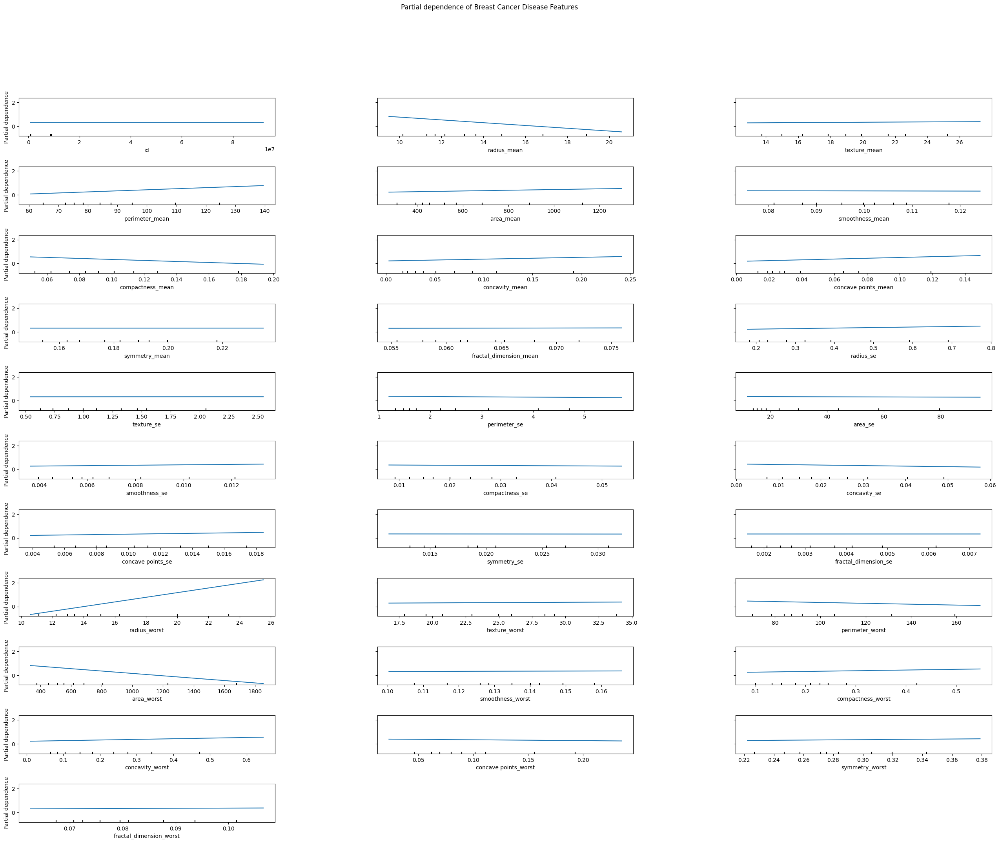

In [67]:
!pip install -U scikit-learn
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# Assuming linear_model and x_test are already defined and linear_model is trained
display = PartialDependenceDisplay.from_estimator(
    linear_model, x_test, features=x_test.columns, n_jobs=3, grid_resolution=20
)

display.figure_.suptitle("Partial dependence of Breast Cancer Disease Features")
display.figure_.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)


- **Plot Title:** The title indicates what the PDP is representing. In this case, it's likely related to breast cancer disease features.

- **Horizontal Axis (X-axis):** This axis represents the range of values for a specific feature.
- **Vertical Axis (Y-axis):** This axis indicates the effect on the model's prediction.

- **Line:** The line represents the average effect on the prediction as the feature value changes. A flat line indicates no effect, while an upward or downward trend shows a positive or negative relationship, respectively.

- **Features:** Each plot corresponds to one feature. Common features in breast cancer datasets include measurements like radius, texture, perimeter, area, smoothness, compactness, concavity, and others.

- **Interpretation:** A steeper line in any direction indicates a stronger relationship between the feature and the outcome. If the line is flat, the feature has little to no effect on the model's prediction.

- **Variability:** Any noticeable spread or deviation of points around the line in individual plots can indicate variability in the feature's effect across different instances in the data.

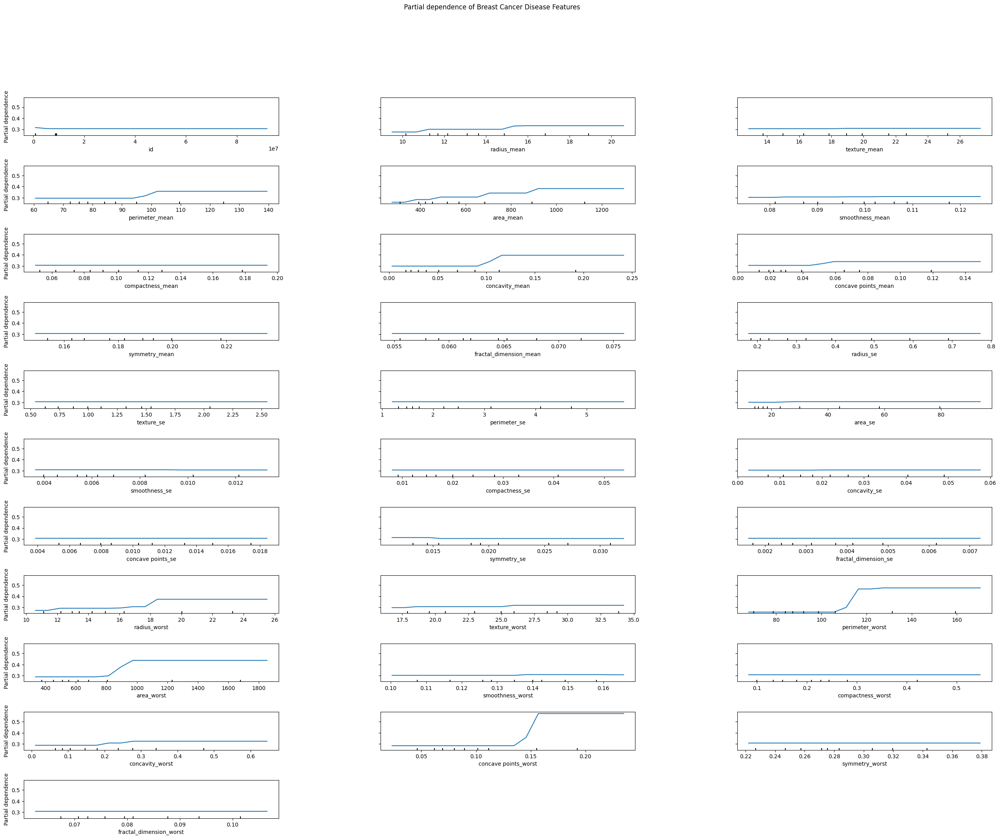

In [70]:
!pip install -U scikit-learn
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# Assuming linear_model and x_test are already defined and linear_model is trained
display = PartialDependenceDisplay.from_estimator(
    tree_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20
)

display.figure_.suptitle("Partial dependence of Breast Cancer Disease Features")
display.figure_.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)


## **Detailed summary of the content would entail for each plot:**

- **Plot Title:** Typically, it indicates that these are PDPs for breast cancer disease features.

- **Plots Layout:** Each individual graph corresponds to a different feature from the dataset. The layout is usually a grid with multiple rows and columns, with each cell containing a plot for a single feature.

- **Horizontal Axis (X-axis):** This axis usually represents the range of values the feature takes within the dataset. It's scaled according to the feature's distribution.

- **Vertical Axis (Y-axis):** This axis represents the partial dependence, which is the average predicted outcome from the model as the feature value changes, while all other features are held constant.

- **The Line:** This line within each plot indicates the relationship between the feature value and the outcome. A horizontal line suggests no relationship, and a sloped line indicates a positive or negative relationship.

- **Individual Features:** Common features in breast cancer datasets that might be included in such plots could include tumor size (e.g., "radius_mean"), tumor texture ("texture_mean"), tumor smoothness ("smoothness_mean"), etc.

- **Interpretation of Trends:** If the line trends upwards as the feature value increases, this suggests that higher values of the feature are associated with a higher predicted outcome (potentially indicating more severe disease). If the line trends downwards, the opposite is true.

- **Data Points:** Individual data points may be scattered along the line, showing the distribution of actual data points from the dataset.

- **Consistency Across Plots:** The consistency of the line across different features can indicate which features have more influence on the model predictions. Features with steeper slopes or more pronounced shapes in their lines are typically more influential.

## **Comparision between SHAP, LIME, and Partial Dependence Plot Analysis**

- **Model agnosticism:** SHAP and LIME are both model-agnostic techniques, which means that they can be applied to any machine learning model regardless of the underlying algorithm or implementation. PDP analysis, on the other hand, is a model-specific technique that requires knowledge of the underlying model's behavior.

- **Interpretability:** SHAP provides a comprehensive measure of feature importance for both individual predictions and across an entire dataset, while LIME provides local approximations of the model's behavior that are more interpretable for individual predictions. PDP analysis provides an easy way to visualize the marginal effect of a feature on the predicted outcome of a model.

- **Complexity:** SHAP is a more complex technique that involves the computation of Shapley values, which can be computationally expensive for large datasets and complex models which we have seen above. LIME and PDP analysis are generally simpler techniques that can be applied more quickly and easily.

# **Conclusion**

The purpose of model interpretability is to understand and explain how a machine learning model works and how it makes predictions or decisions. Interpretability is important because it helps to build trust in the model and its predictions, and it enables users to identify and correct errors, biases, or limitations in the model.

We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

## **Citations**

1. Many techniques used in this notebook have been adopted from the following github repositories

- Owner - AI Skunkworks Link - https://github.com/aiskunks/Skunks_Skool

- Author name - Prof Nik Bear Brown Link - https://github.com/nikbearbrown/

2. Automated Machine Learning with H20 Link - https://towardsdatascience.com/automated-machine-learning-with-h2o-258a2f3a203f

3. Explain Your Model with the SHAP Values Link - https://medium.com/dataman-in-ai/explain-your-model-with-the-shap-values-bc36aac4de3d

4. Interpretability Methods in Machine Learning: A Brief Survey Link- https://www.twosigma.com/articles/interpretability-methods-in-machine-learning-a-brief-survey/



## **Licensing**

Copyright 2023 Payal Sanjay Nagaonkar

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

